# Section 0: Data Set Up

In [3]:
# Import Libraries and Load Data
# Core libraries
import pandas as pd
import numpy as np

# Text processing
import re
import string
from collections import Counter

# Word cloud
from wordcloud import WordCloud, STOPWORDS

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Display settings
plt.style.use("seaborn-v0_8")

# Load your dataset
df = pd.read_csv("data/sentiment_scores/output_sentiment_clean.csv")

# Quick preview
df.head(2)


,politician,type_of_speech,file_name,text,sadness,joy,love,anger,fear,surprise,...,topic_0_score,topic_1_score,topic_2_score,topic_3_score,topic_4_score,topic_5_score,topic_6_score,cluster,tsne_x,tsne_y
0,king_angus_s_jr,partisan_rally_speeches,"""now_is_the_time_to_establish_a_redline_—_the_...",the senate for maine is recognized. we all beg...,0.124538,0.320375,0.001485,0.482588,0.069628,0.001386,...,0.042844,0.036995,0.017078,0.013314,0.000972,0.004572,0.083707,1,-23.976166,-13.263207
1,king_angus_s_jr,partisan_rally_speeches,Gov._angus_king_speaking_at_a_rally_in_portlan...,angus king. the dogmas of the quiet past are i...,0.013997,0.270341,0.002355,0.592581,0.118445,0.002281,...,0.057972,0.016637,0.014935,0.000000,0.000000,0.006834,0.036449,1,-41.195934,-72.913580


In [4]:
party_map = {
    "king_angus_s_jr": "Independent",            # Angus King is an Independent who caucuses with Democrats
    "cruz_ted": "Republican",
    "frost_maxwell": "Democrat",
    "hirono_mazie_k": "Democrat",
    "moore_barry": "Republican",
    "booker_cory_a": "Democrat",
    "cassidy_bill": "Republican",
    "waters_maxine": "Democrat",
    "andrew_cuomo": "Democrat",
    "donalds_byron": "Republican",
    "kaine_tim": "Democrat",
    "barrasso_john": "Republican",
    "ernst_joni": "Republican",
    "bernie_sanders": "Independent",             # Bernie Sanders is Independent but caucuses with Democrats
    "curtis_john_r": "Republican",
    "cortez_masto_catherine": "Democrat",
    "blunt_rochester_lisa": "Democrat",
    "justice_james_c": "Republican",             # Jim Justice is Republican
    "cotton_tom": "Republican",
    "lee_laurel": "Republican",                  # Laurel Lee, Republican representative from Florida
    "moskowitz_jared": "Democrat",
    "mills_cory": "Republican",
    "khanna_ro": "Democrat",
    "lamalfa_doug": "Republican",
    "ciscomani_juan": "Republican",
    "kamlager_dove_sydney": "Democrat",
    "fetterman_john": "Democrat",
    "grassley_chuck": "Republican",
    "crapo_mike": "Republican",
    "gillibrand_kirsten_e": "Democrat",
    "sherman_brad": "Democrat",
    "carbajal_salud": "Democrat",
    "cammack_kat": "Republican",
    "daines_steve": "Republican",
    "issa_darrell": "Republican",
    "graham_lindsey": "Republican",
    "blumenthal_richard": "Democrat",
    "ted_cruz": "Republican",                    # duplicate naming version
    "johnson_ron": "Republican",
    "britt_katie_boyd": "Republican",
    "crane_elijah": "Republican",
    "kim_young": "Republican",                   # Young Kim is Republican
    "valadao_david": "Republican",
    "banks_jim": "Republican",
    "marco_rubio": "Republican",
    "barragan_nanette": "Democrat",
    "collins_susan_m": "Republican",
    "dunn_neal": "Republican",
    "alsobrooks_angela_d": "Democrat",
    "pettersen_brittany": "Democrat",
    "blackburn_marsha": "Republican",
    "soto_darren": "Democrat",
    "mullin_kevin": "Republican",
    "huffman_jared": "Democrat",
    "swalwell_eric": "Democrat",
    "panetta_jimmy": "Democrat",
    "elizabeth_warren": "Democrat",
    "coons_christopher_a": "Democrat",
    "franklin_scott": "Republican",
    "durbin_richard_j": "Democrat",
    "brownley_julia": "Democrat",
    "kim_andy": "Democrat",
    "jacobs_sara": "Democrat",
    "hagerty_bill": "Republican",
    "mast_brian": "Republican",
    "vargas_juan": "Democrat",
    "kelly_mark": "Democrat",
    "degette_diana": "Democrat",
    "strong_dale": "Republican",
    "cantwell_maria": "Democrat",
    "obernolte_jay": "Republican",
    "takano_mark": "Democrat",
    "hyde_smith_cindy": "Republican",
    "hickenlooper_john_w": "Democrat",
    "budd_ted": "Republican",
    "gallego_ruben": "Democrat",
    "radewagen_aumua_amata": "Republican",
    "boozman_john": "Republican",
    "mitch_mcconnell": "Republican",
    "correa_j": "Democrat",
    "hayes_jahana": "Democrat",
    "rutherford_john": "Republican",
    "ruiz_raul": "Democrat",
    "kennedy_john": "Republican",
    "cornyn_john": "Republican",
    "baldwin_tammy": "Democrat",
    "cramer_kevin": "Republican",
    "boebert_lauren": "Republican",
    "chuck_schumer": "Democrat",
    "peters_scott": "Democrat",
    "jd_vance": "Republican",
    "frankel_lois": "Democrat",
    "bera_ami": "Democrat",
    "bean_aaron": "Republican",
    "garcia_robert": "Democrat",
    "husted_jon": "Republican",
    "hoeven_john": "Republican",
    "desantis_ron": "Republican",
    "biggs_andy": "Republican"
}


# SECTION 1: Word Clouds

In [5]:
# Cleaning Function for Text

stopwords = set(STOPWORDS)

def clean_text(text):
    if pd.isna(text):
        return ""
    
    text = text.lower()
    text = re.sub(r"[^\w\s]", " ", text)                 # remove punctuation
    text = re.sub(r"\d+", " ", text)                    # remove numbers
    words = text.split()
    words = [w for w in words if w not in stopwords and len(w) > 2]
    
    return " ".join(words)

df["clean_text"] = df["text"].apply(clean_text)


In [6]:
# Word Cloud Function

def plot_wordcloud(text, title):
    wordcloud = WordCloud(
        width=900,
        height=500,
        background_color="white",
        stopwords=stopwords,
        max_words=100
    ).generate(text)
    
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title, fontsize=18)
    plt.show()


Generating word cloud for: partisan_rally_speeches


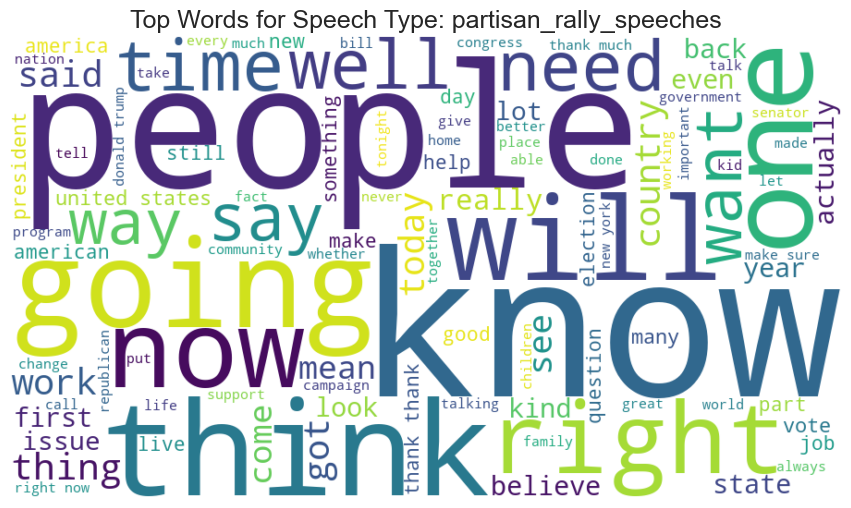

Generating word cloud for: bipartisan_and_other_speeches


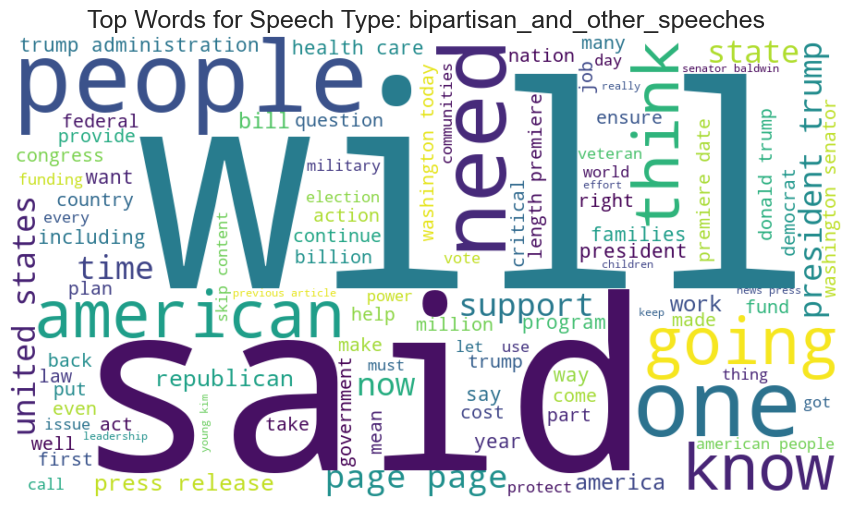

Generating word cloud for: house_floor_speeches


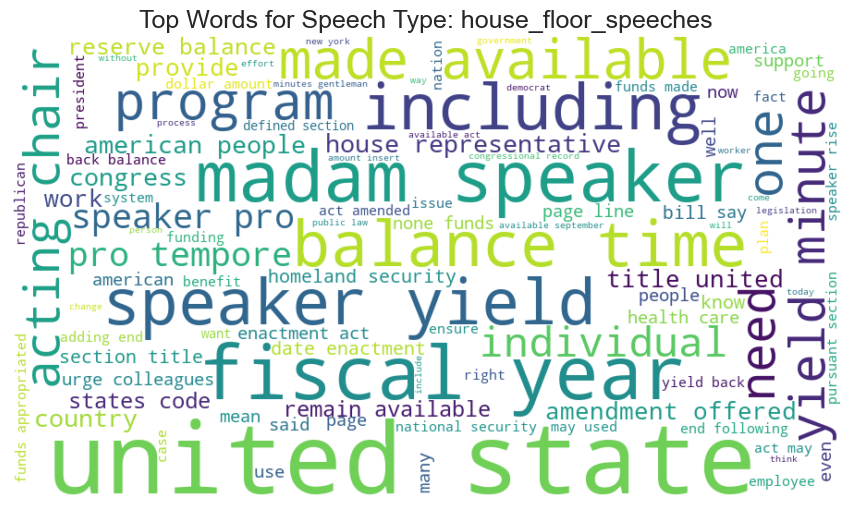

Generating word cloud for: senate_floor_speeches


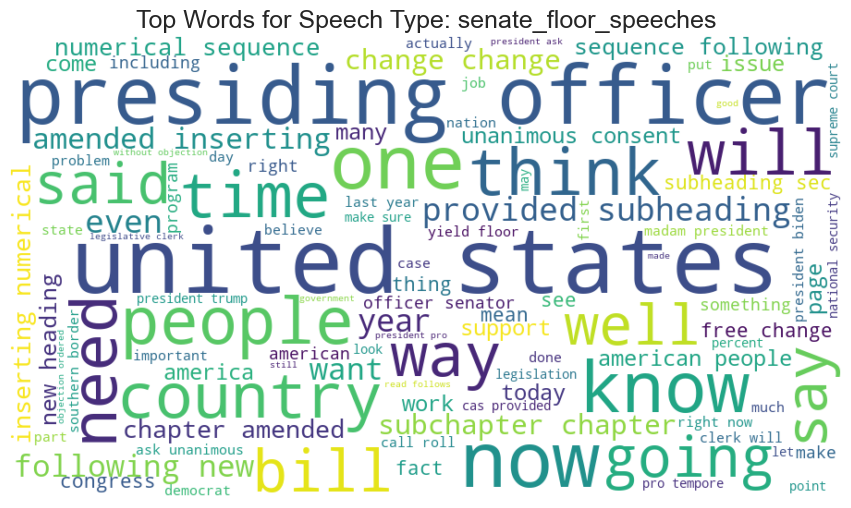

Skipping bipartisan_and_other_speeches 2 because it has no usable words.


In [7]:
# Word Clouds by Type of Speech


speech_types = df["type_of_speech"].unique()

for stype in speech_types:
    subset = df[df["type_of_speech"] == stype]
    combined_text = " ".join(subset["clean_text"].tolist()).strip()
    
    if len(combined_text.split()) == 0:
        print(f"Skipping {stype} because it has no usable words.")
        continue
    
    print(f"Generating word cloud for: {stype}")
    plot_wordcloud(combined_text, f"Top Words for Speech Type: {stype}")



In [8]:
# Top 10 words per speech

def top_words(text, n=10):
    words = text.split()
    counts = Counter(words)
    return counts.most_common(n)

all_top_words_by_type = {}

for stype in speech_types:
    subset = df[df["type_of_speech"] == stype]
    combined_text = " ".join(subset["clean_text"].tolist())
    all_top_words_by_type[stype] = top_words(combined_text)

all_top_words_by_type


{'partisan_rally_speeches': [('people', 5372),
  ('will', 5340),
  ('know', 5211),
  ('going', 4308),
  ('one', 3565),
  ('thank', 3516),
  ('think', 3274),
  ('want', 3105),
  ('now', 3062),
  ('right', 2828)],
 'bipartisan_and_other_speeches': [('senator', 2000),
  ('trump', 1363),
  ('will', 1321),
  ('president', 1069),
  ('act', 1042),
  ('senate', 1000),
  ('said', 974),
  ('people', 963),
  ('bill', 919),
  ('washington', 861)],
 'house_floor_speeches': [('act', 17231),
  ('section', 16334),
  ('speaker', 13295),
  ('will', 11038),
  ('bill', 11020),
  ('states', 9364),
  ('time', 9259),
  ('year', 8375),
  ('secretary', 8327),
  ('united', 8137)],
 'senate_floor_speeches': [('will', 12650),
  ('president', 11271),
  ('people', 11022),
  ('bill', 7691),
  ('senator', 7366),
  ('one', 5996),
  ('going', 5905),
  ('now', 5890),
  ('senate', 5587),
  ('country', 5387)],
 'bipartisan_and_other_speeches 2': []}

Generating word cloud for: chuck_schumer


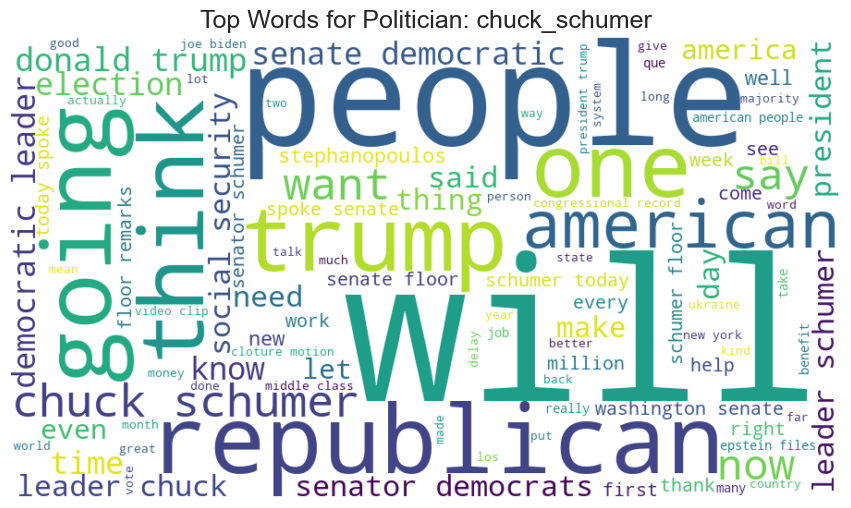

Generating word cloud for: elizabeth_warren


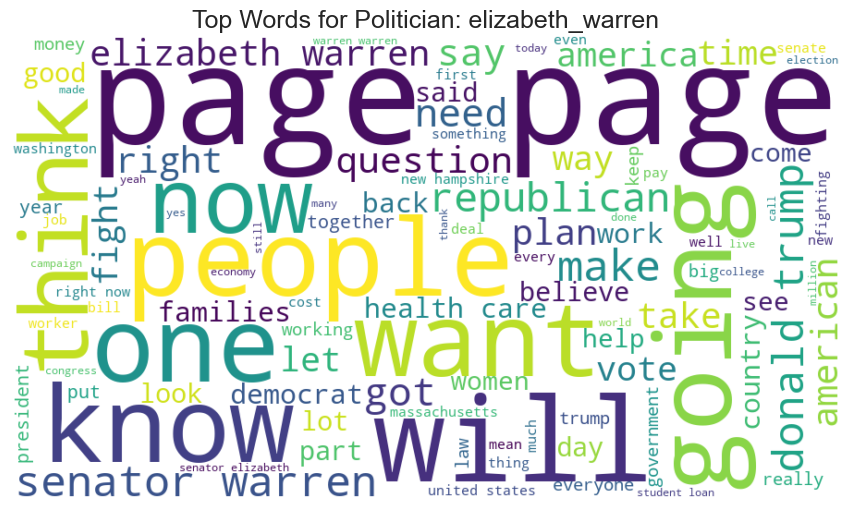

Generating word cloud for: bernie_sanders


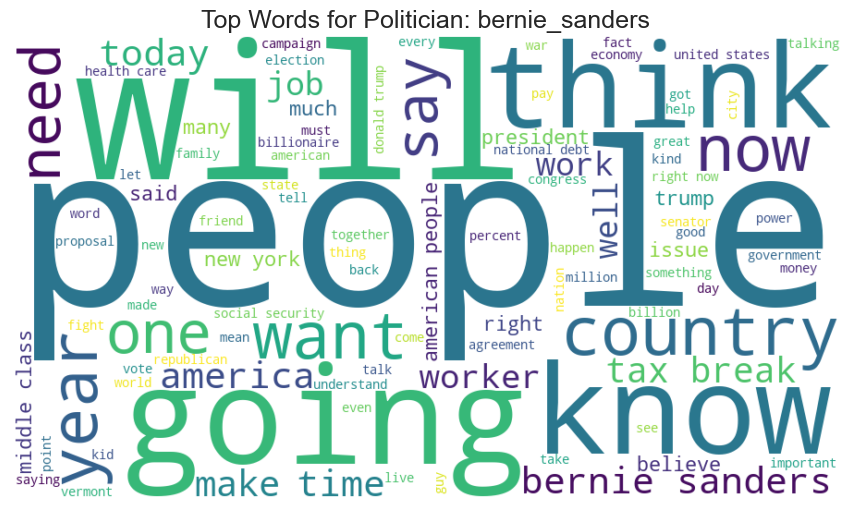

Generating word cloud for: marco_rubio


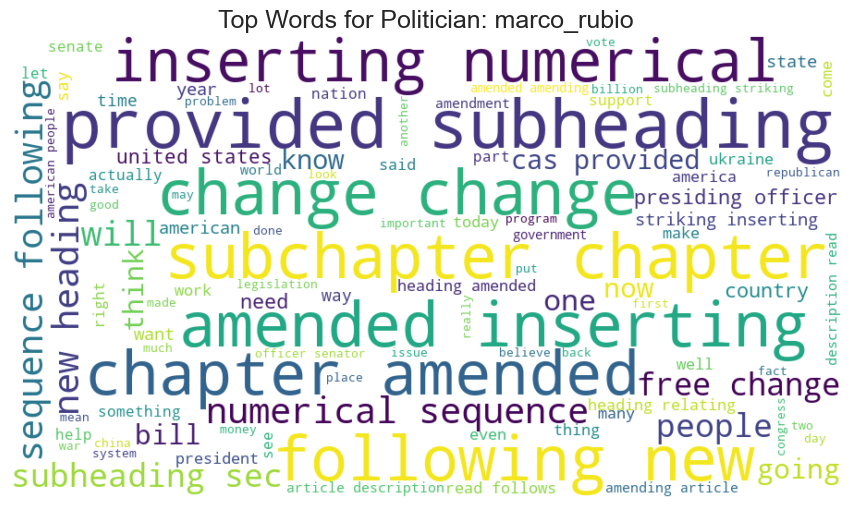

Generating word cloud for: mitch_mcconnell


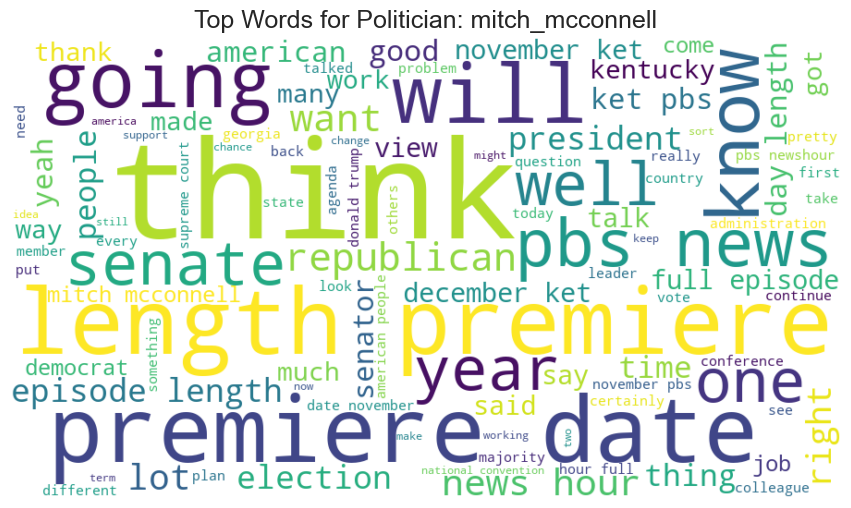

Generating word cloud for: ted_cruz


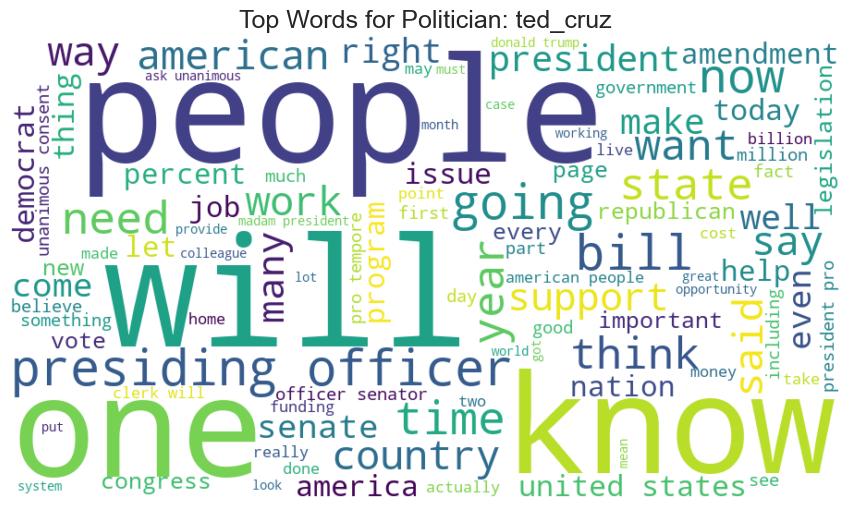

Generating word cloud for: desantis_ron


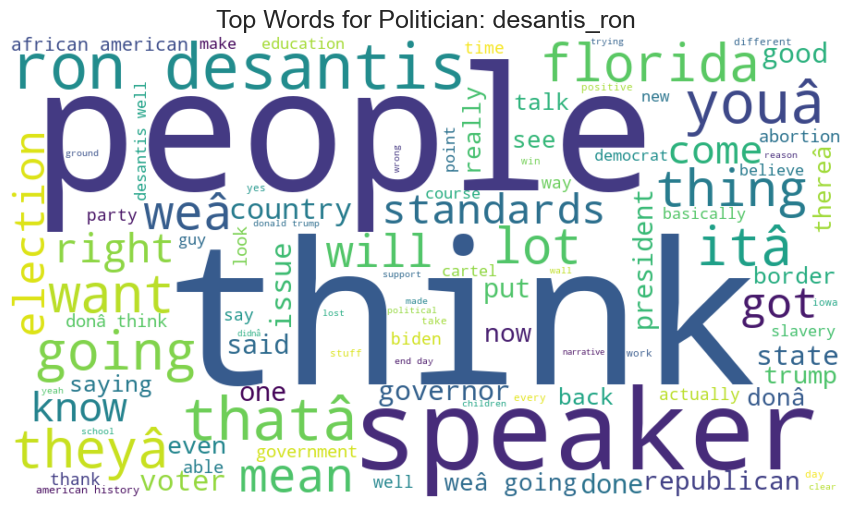

Generating word cloud for: gillibrand_kirsten_e


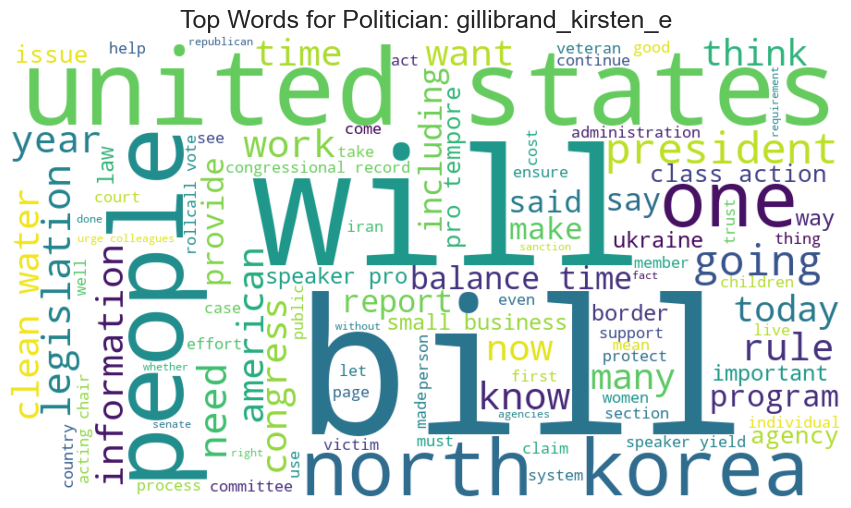

Generating word cloud for: fetterman_john


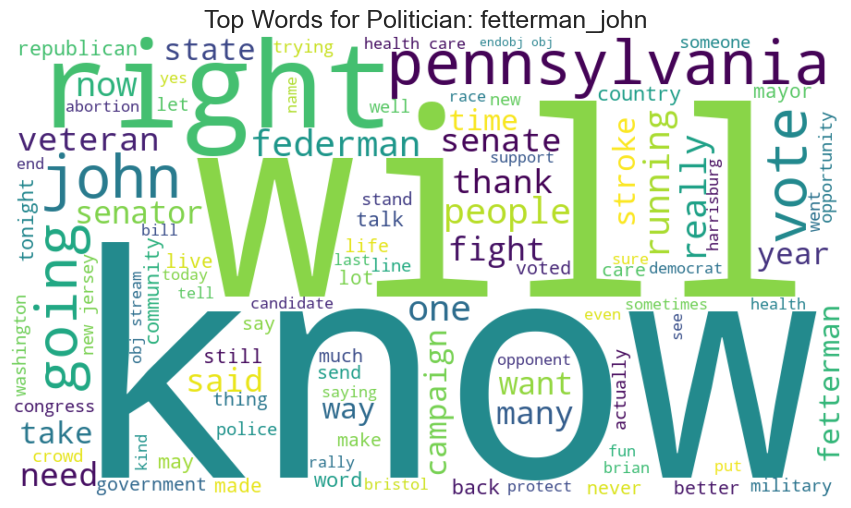

Generating word cloud for: booker_cory_a


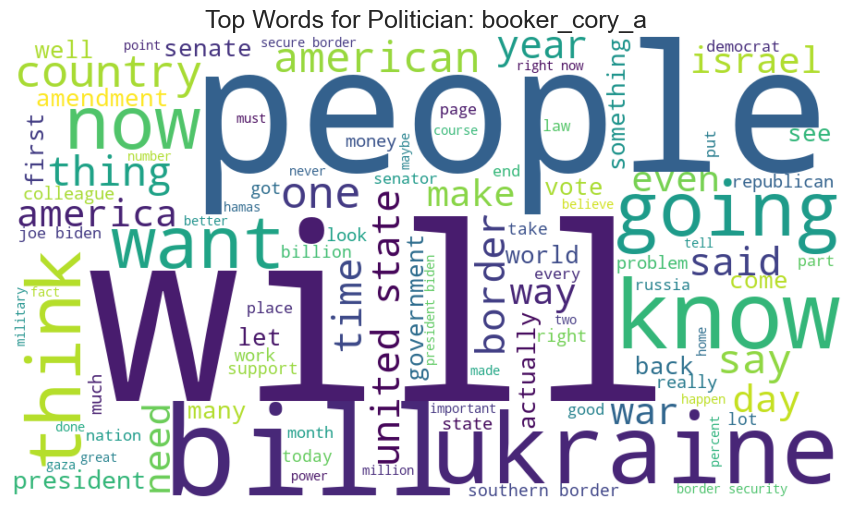

In [9]:
# Word clouds per politician

top10_politicians = [
    "chuck_schumer",
    "elizabeth_warren",
    "bernie_sanders",
    "marco_rubio",
    "mitch_mcconnell",
    "ted_cruz",
    "desantis_ron",
    "gillibrand_kirsten_e",
    "fetterman_john",
    "booker_cory_a"
]

for pol in top10_politicians:
    subset = df[df["politician"] == pol]
    
    if subset.empty:
        print(f"Skipping {pol} because they do not appear in the dataset.")
        continue
    
    combined_text = " ".join(subset["clean_text"].tolist()).strip()
    
    if len(combined_text.split()) == 0:
        print(f"Skipping {pol} because they have no usable words.")
        continue

    print(f"Generating word cloud for: {pol}")
    plot_wordcloud(combined_text, f"Top Words for Politician: {pol}")


# Without top 10

# politicians = df["politician"].unique()

# for pol in politicians:
#     subset = df[df["politician"] == pol]
#     combined_text = " ".join(subset["clean_text"].tolist()).strip()
    
#     if len(combined_text.split()) == 0:
#         print(f"Skipping {pol} because it has no usable words.")
#         continue
    
#     print(f"Generating word cloud for: {pol}")
#     plot_wordcloud(combined_text, f"Top Words for Politician: {pol}")


In [11]:
# Top 10 Words per Politician

all_top_words_by_pol = {}

for pol in top10_politicians:
    subset = df[df["politician"] == pol]
    combined_text = " ".join(subset["clean_text"].tolist())
    all_top_words_by_pol[pol] = top_words(combined_text)

all_top_words_by_pol


{'chuck_schumer': [('will', 202),
  ('schumer', 197),
  ('senate', 181),
  ('trump', 168),
  ('president', 139),
  ('people', 116),
  ('leader', 108),
  ('democrats', 103),
  ('senator', 99),
  ('democratic', 79)],
 'elizabeth_warren': [('warren', 573),
  ('page', 454),
  ('people', 375),
  ('trump', 368),
  ('will', 362),
  ('senator', 303),
  ('going', 293),
  ('one', 275),
  ('now', 246),
  ('make', 245)],
 'bernie_sanders': [('people', 1219),
  ('will', 688),
  ('country', 629),
  ('going', 628),
  ('tax', 518),
  ('now', 445),
  ('know', 409),
  ('think', 401),
  ('president', 393),
  ('one', 388)],
 'marco_rubio': [('change', 3017),
  ('sec', 2969),
  ('heading', 2555),
  ('will', 2478),
  ('inserting', 2262),
  ('people', 2215),
  ('amended', 2017),
  ('president', 1995),
  ('new', 1981),
  ('provided', 1902)],
 'mitch_mcconnell': [('think', 232),
  ('length', 205),
  ('premiere', 203),
  ('date', 202),
  ('president', 178),
  ('will', 174),
  ('going', 156),
  ('know', 138),
  

Generating word cloud for: Independent


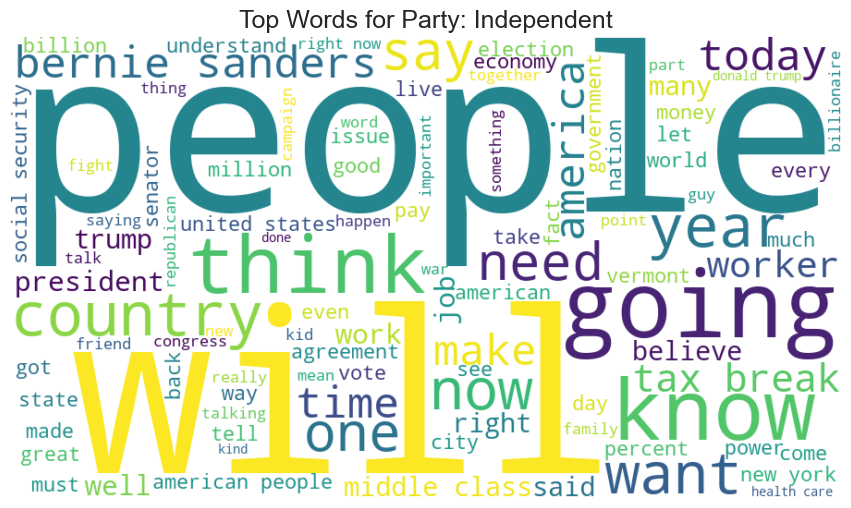

Generating word cloud for: Republican


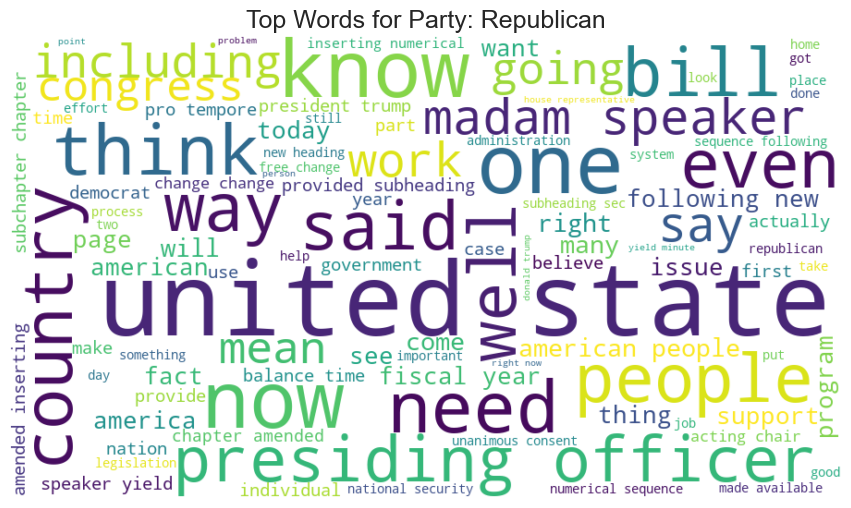

Generating word cloud for: Democrat


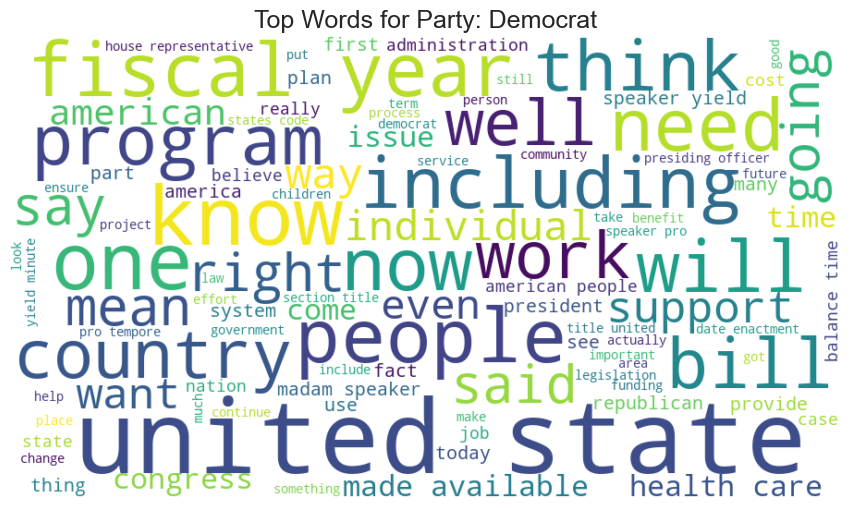

Skipping nan because it has no usable words.


In [12]:
# Add party column using the mapping we created
df["party"] = df["politician"].map(party_map)
df["party"].value_counts()

# Word clouds per party

parties = df["party"].unique()

for party in parties:
    subset = df[df["party"] == party]
    combined_text = " ".join(subset["clean_text"].tolist()).strip()
    
    if len(combined_text.split()) == 0:
        print(f"Skipping {party} because it has no usable words.")
        continue
    
    print(f"Generating word cloud for: {party}")
    plot_wordcloud(combined_text, f"Top Words for Party: {party}")


In [13]:
# Top 10 words per party

top_words_party = {}

for party in parties:
    subset = df[df["party"] == party]
    combined_text = " ".join(subset["clean_text"].tolist()).strip()
    top_words_party[party] = top_words(combined_text)

top_words_party


{'Independent': [('people', 1231),
  ('will', 709),
  ('country', 639),
  ('going', 638),
  ('tax', 519),
  ('now', 456),
  ('know', 420),
  ('think', 410),
  ('president', 408),
  ('one', 405)],
 'Republican': [('will', 17863),
  ('president', 14042),
  ('people', 13621),
  ('bill', 11709),
  ('act', 11554),
  ('time', 10087),
  ('section', 9389),
  ('states', 9032),
  ('amendment', 8760),
  ('one', 8411)],
 'Democrat': [('will', 11104),
  ('act', 10695),
  ('section', 9308),
  ('people', 8396),
  ('bill', 8035),
  ('states', 6897),
  ('year', 6753),
  ('speaker', 6247),
  ('time', 6221),
  ('state', 5822)],
 nan: []}

# SECTION 2: Speech Length and Sentence Length EDA

In [14]:
# Count words in each cleaned speech
df["word_count"] = df["clean_text"].apply(lambda x: len(x.split()))
df[["politician", "type_of_speech", "word_count"]].head()


,politician,type_of_speech,word_count
0,king_angus_s_jr,partisan_rally_speeches,1226
1,king_angus_s_jr,partisan_rally_speeches,234
2,king_angus_s_jr,partisan_rally_speeches,464
3,king_angus_s_jr,bipartisan_and_other_speeches,55
4,king_angus_s_jr,bipartisan_and_other_speeches,55


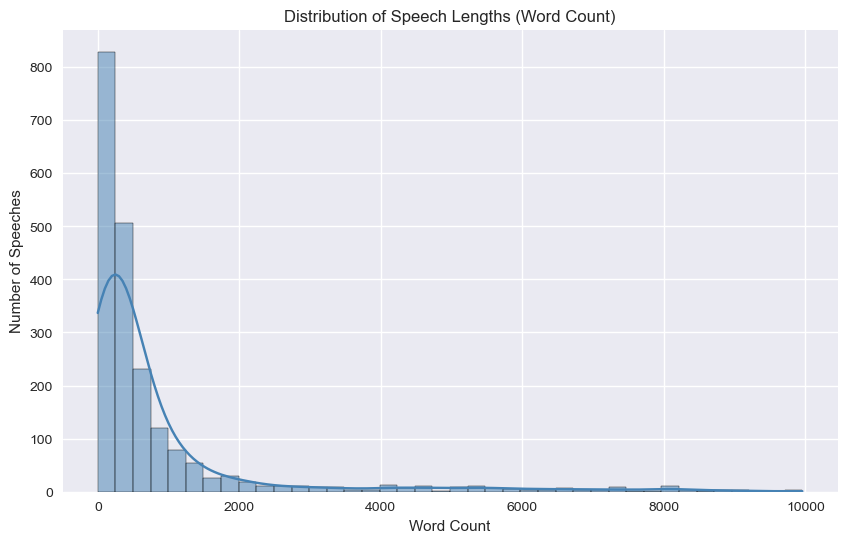

In [55]:

df = df[df["word_count"] < 10000]


# There are some outliers so we are removing anything that out of the 98% threshold

# Overall Distribution of Speech Lengths
plt.figure(figsize=(10, 6))
sns.histplot(df["word_count"], bins=40, kde=True, color="steelblue")
plt.title("Distribution of Speech Lengths (Word Count)")
plt.xlabel("Word Count")
plt.ylabel("Number of Speeches")
plt.show()


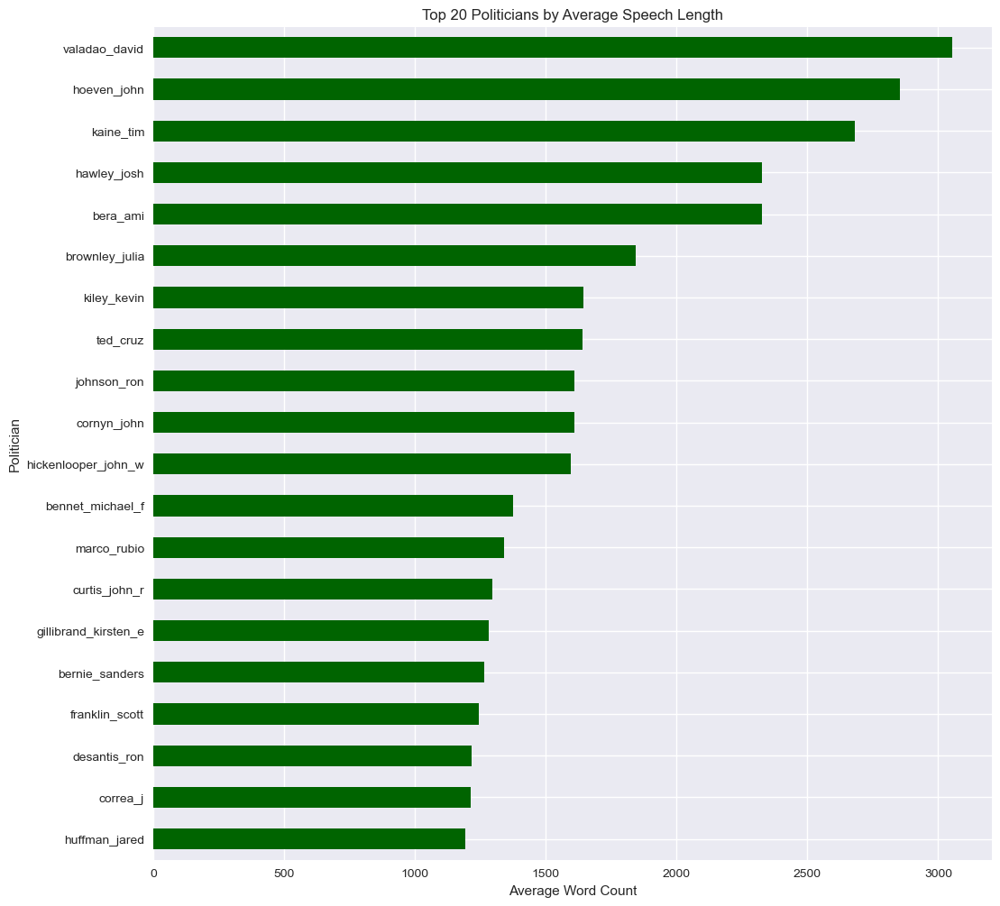

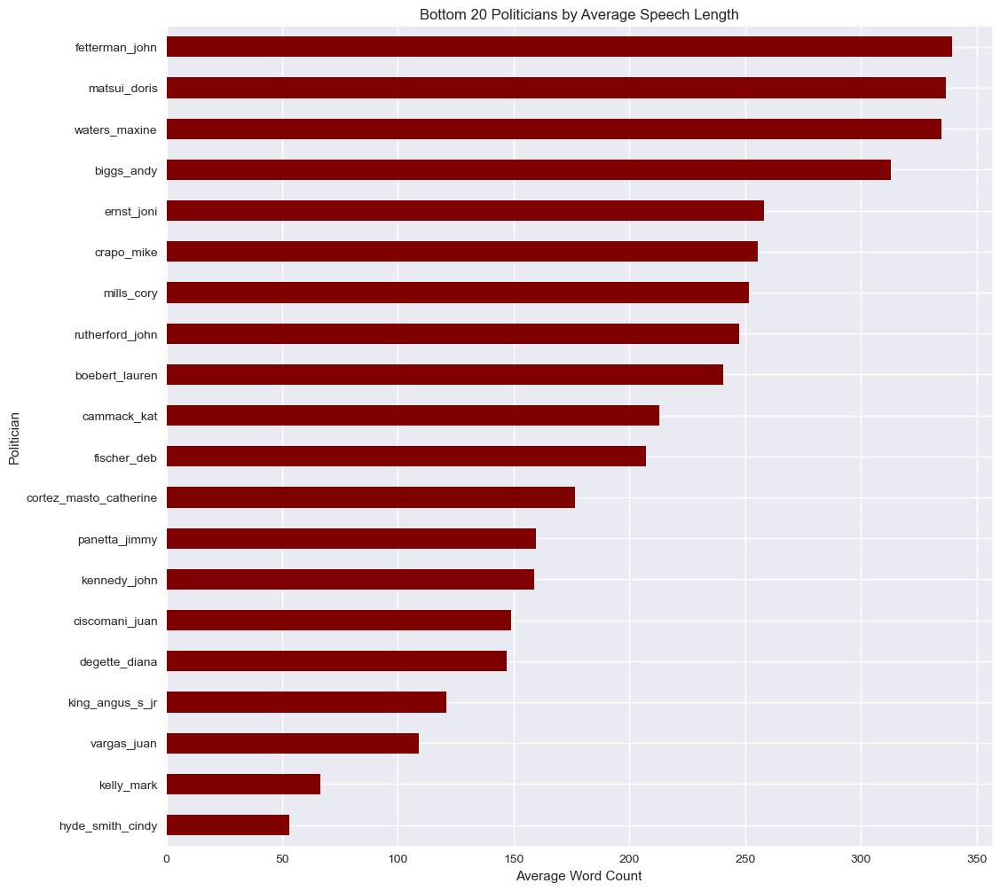

In [56]:
# Average Speech Length per Politician

avg_len_by_pol = df.groupby("politician")["word_count"].mean().sort_values(ascending=False)

plt.figure(figsize=(12, 12))
avg_len_by_pol.head(20).plot(kind="barh", color="darkgreen")
plt.title("Top 20 Politicians by Average Speech Length")
plt.xlabel("Average Word Count")
plt.ylabel("Politician")
plt.gca().invert_yaxis()
plt.show()

avg_len_by_pol.tail(20).plot(kind="barh", figsize=(12, 12), color="maroon")
plt.title("Bottom 20 Politicians by Average Speech Length")
plt.xlabel("Average Word Count")
plt.ylabel("Politician")
plt.gca().invert_yaxis()
plt.show()


In [57]:
# Longest Individual Speeches

df.nlargest(10, "word_count")[["politician", "file_name", "word_count"]]



,politician,file_name,word_count
1757,boozman_john,floor_2025_10_23_CREC_2025_10_23_pt1_PgS7705_6...,9956
2136,hoeven_john,floor_2025_10_23_CREC_2025_10_23_pt1_PgS7705_6...,9956
876,valadao_david,floor_2025_07_17_CREC_2025_07_17_pt1_PgH3434_p...,9815
309,curtis_john_r,floor_2016_01_11_CREC_2016_01_11_pt1_PgH229_pr...,9185
597,gillibrand_kirsten_e,floor_2016_01_11_CREC_2016_01_11_pt1_PgH229_pr...,9185
1285,coons_christopher_a,June_2016_manufacturing_jobs_for_america_rally...,9071
1097,alsobrooks_angela_d,floor_2016_02_04_CREC_2016_02_04_pt1_PgH570_7_...,8819
1620,hickenlooper_john_w,floor_2016_02_04_CREC_2016_02_04_pt1_PgH570_7_...,8819
760,johnson_ron,floor_2019_09_20_CREC_2019_09_20_pt1_PgH7840_5...,8794
1837,correa_j,floor_2024_01_12_CREC_2024_01_12_pt1_PgH112_7_...,8764


In [58]:
import spacy
nlp = spacy.load("en_core_web_sm")

def avg_sentence_length_spacy(text):
    if pd.isna(text) or len(text.strip()) == 0:
        return np.nan
    doc = nlp(text)
    sentences = [sent.text.strip() for sent in doc.sents if len(sent.text.strip()) > 0]
    if len(sentences) == 0:
        return np.nan
    sentence_lengths = [len(s.split()) for s in sentences]
    return np.mean(sentence_lengths)

df["avg_sentence_length"] = df["text"].apply(avg_sentence_length_spacy)


In [ ]:
# Remove Sentence Length Outliers and NAs
df_clean = df[df["avg_sentence_length"] < 50].dropna(subset=["avg_sentence_length"]).copy()


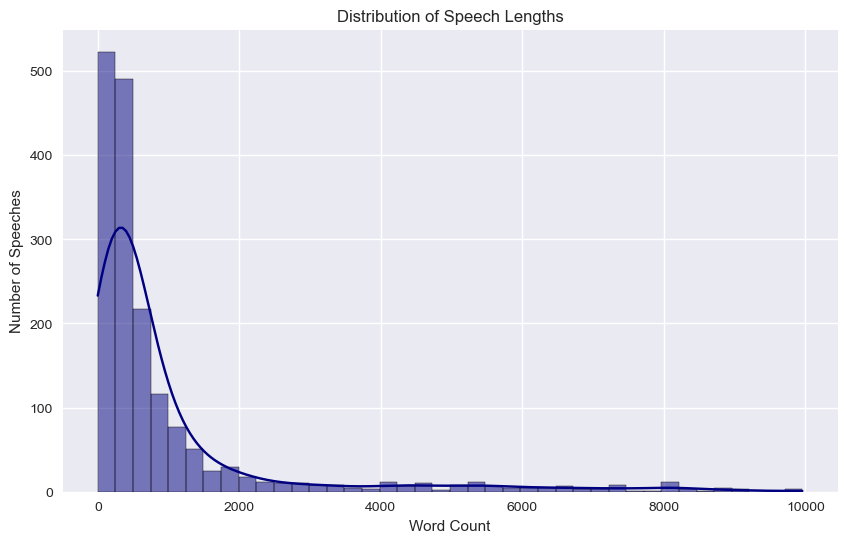

In [61]:
# Distribution of Word Count
plt.figure(figsize=(10, 6))
sns.histplot(df_clean["word_count"], bins=40, kde=True, color="navy")
plt.title("Distribution of Speech Lengths")
plt.xlabel("Word Count")
plt.ylabel("Number of Speeches")
plt.show()


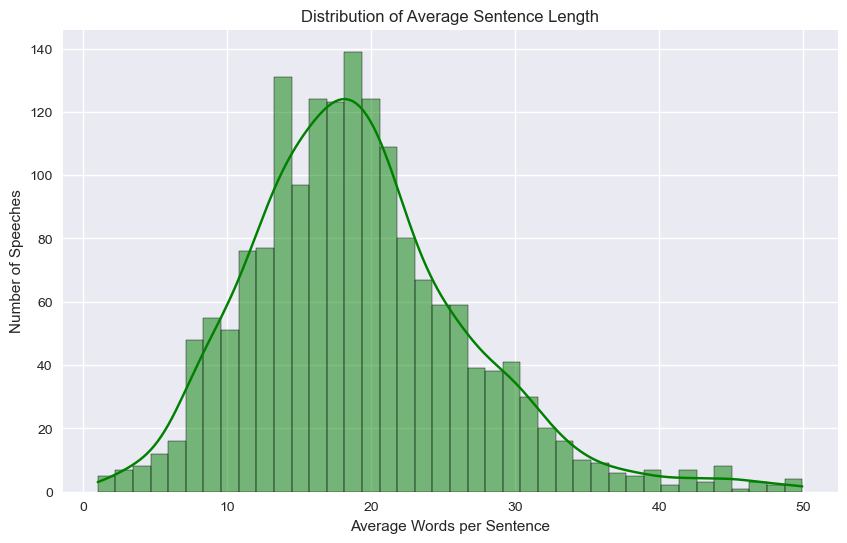

In [62]:
# Distribution of Sentence length

plt.figure(figsize=(10, 6))
sns.histplot(df_clean["avg_sentence_length"], bins=40, kde=True, color="green")
plt.title("Distribution of Average Sentence Length")
plt.xlabel("Average Words per Sentence")
plt.ylabel("Number of Speeches")
plt.show()


## PART A: Comparison by Political Party

In [63]:
# Average Word Count per Party
avg_wc_party = df_clean.groupby("party")["word_count"].mean().sort_values(ascending=False)
avg_wc_party


party
Independent    1216.151515
Republican      997.110070
Democrat        909.912418
Name: word_count, dtype: float64

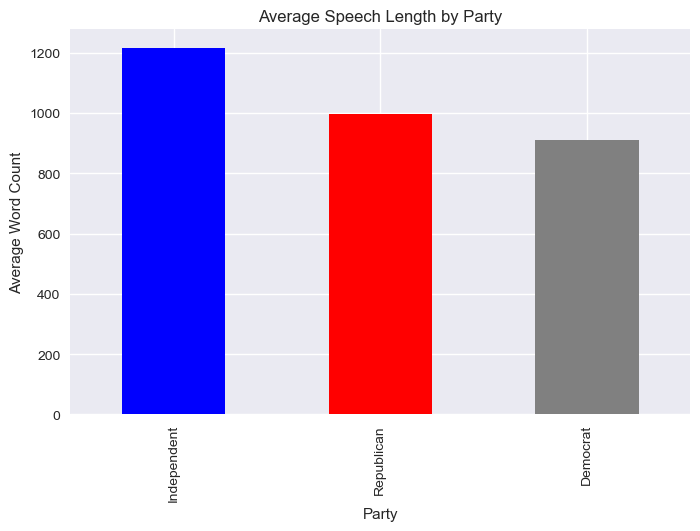

In [64]:
# Plot
plt.figure(figsize=(8, 5))
avg_wc_party.plot(kind="bar", color=["blue", "red", "gray"])
plt.title("Average Speech Length by Party")
plt.ylabel("Average Word Count")
plt.xlabel("Party")
plt.show()


C:\Users\mayas\AppData\Local\Temp\ipykernel_41952\1935474347.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_clean, x="party", y="word_count", palette="Set2")


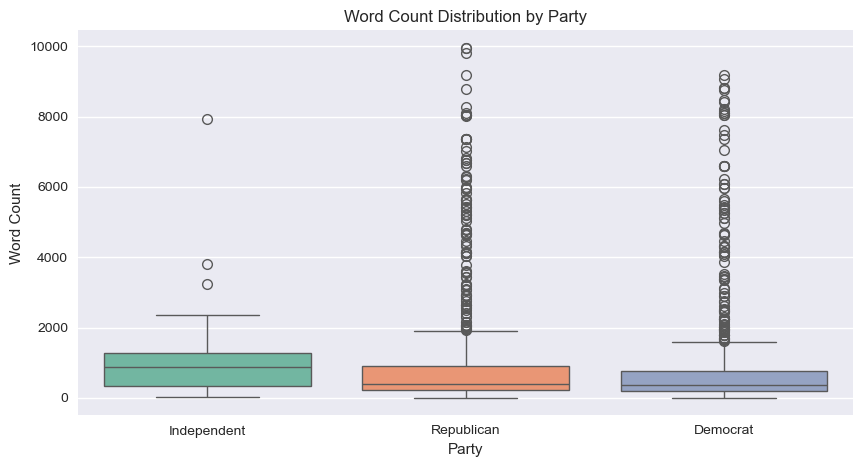

In [65]:
# Boxplot of Speech Length by Party

plt.figure(figsize=(10, 5))
sns.boxplot(data=df_clean, x="party", y="word_count", palette="Set2")
plt.title("Word Count Distribution by Party")
plt.xlabel("Party")
plt.ylabel("Word Count")
plt.show()



In [67]:
# Statistical Test: Word Count by Party
import itertools
from scipy.stats import mannwhitneyu

parties = df_clean["party"].unique()
wc_pairwise = {}

for p1, p2 in itertools.combinations(parties, 2):
    g1 = df_clean[df_clean["party"] == p1]["word_count"]
    g2 = df_clean[df_clean["party"] == p2]["word_count"]
    stat, p = mannwhitneyu(g1, g2)
    wc_pairwise[(p1, p2)] = p

wc_pairwise




C:\Users\mayas\AppData\Local\Temp\ipykernel_41952\3777768851.py:11: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p = mannwhitneyu(g1, g2)


{('Independent', 'Republican'): np.float64(0.012462566884282296),
 ('Independent', 'Democrat'): np.float64(0.0033453843470572595),
 ('Independent', nan): np.float64(nan),
 ('Republican', 'Democrat'): np.float64(0.09135020890627814),
 ('Republican', nan): np.float64(nan),
 ('Democrat', nan): np.float64(nan)}

In [68]:
# Average sentence length per party
avg_sl_party = df_clean.groupby("party")["avg_sentence_length"].mean().sort_values(ascending=False)
avg_sl_party


party
Republican     19.109486
Independent    19.026495
Democrat       18.938527
Name: avg_sentence_length, dtype: float64

In [25]:
avg_sentence_party = df.groupby("party")["avg_sentence_length"].mean().sort_values(ascending=False)
avg_sentence_party



party
Independent    40.498449
Democrat       24.433402
Republican     22.875790
Name: avg_sentence_length, dtype: float64

In [70]:
# Average Word Count per Speech Type
avg_wc_type = df_clean.groupby("type_of_speech")["word_count"].mean().sort_values(ascending=False)
avg_wc_type




type_of_speech
house_floor_speeches             1561.333333
senate_floor_speeches            1273.069498
partisan_rally_speeches           911.753650
bipartisan_and_other_speeches     407.836852
Name: word_count, dtype: float64

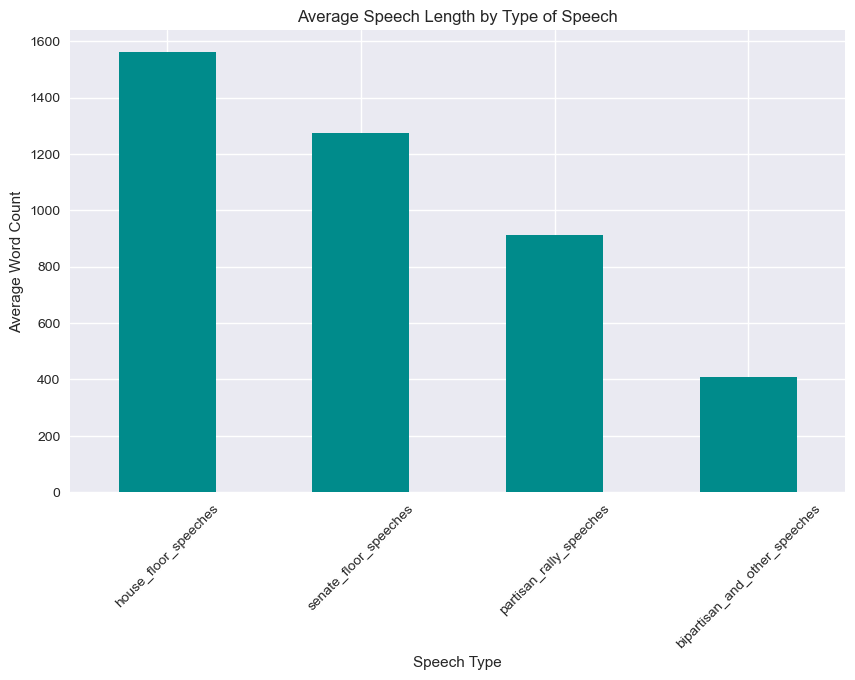

In [71]:
plt.figure(figsize=(10, 6))
avg_wc_type.plot(kind="bar", color="darkcyan")
plt.title("Average Speech Length by Type of Speech")
plt.ylabel("Average Word Count")
plt.xlabel("Speech Type")
plt.xticks(rotation=45)
plt.show()


C:\Users\mayas\AppData\Local\Temp\ipykernel_41952\1974655441.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df_clean, x="type_of_speech", y="word_count", palette="Set3")


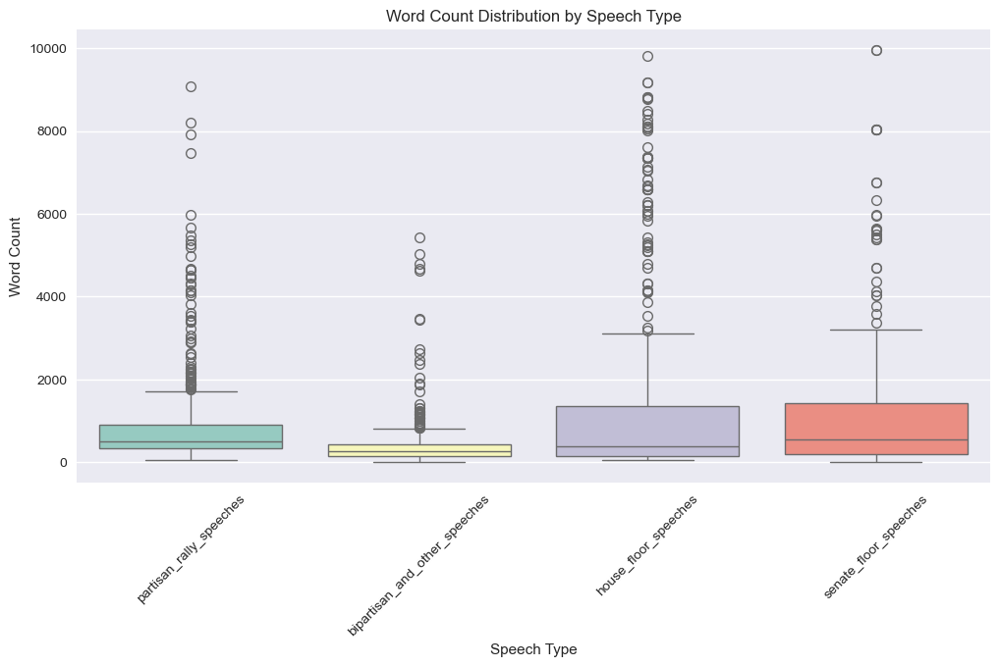

In [72]:
# Boxplot of Word Count by Speech Type

plt.figure(figsize=(12, 6))
sns.boxplot(data=df_clean, x="type_of_speech", y="word_count", palette="Set3")
plt.title("Word Count Distribution by Speech Type")
plt.xlabel("Speech Type")
plt.ylabel("Word Count")
plt.xticks(rotation=45)
plt.show()


In [73]:
# Average Sentence length by speech type

avg_sl_type = df_clean.groupby("type_of_speech")["avg_sentence_length"].mean().sort_values(ascending=False)
avg_sl_type


type_of_speech
bipartisan_and_other_speeches    25.180744
house_floor_speeches             17.092687
senate_floor_speeches            16.343342
partisan_rally_speeches          16.155817
Name: avg_sentence_length, dtype: float64

# SECTION 3: Clustering Analysis (By Party and By Speech Type)

## 3.1. Speech-level Clustering

In [82]:
emotion_cols = ["sadness", "joy", "love", "anger", "fear", "surprise"]
topic_cols = [c for c in df_clean.columns if c.startswith("topic_")]

features = emotion_cols + topic_cols

df_features = df_clean[features].copy()


In [83]:
# Scaling features before clustering
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X = scaler.fit_transform(df_features)



c:\Users\mayas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(
c:\Users\mayas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(
c:\Users\mayas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(
c:\Users\mayas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

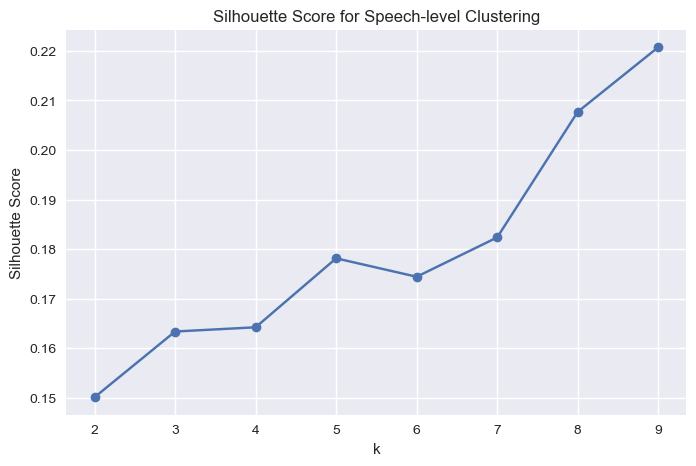

In [86]:
# Use the Silhouette Score to determine k
from sklearn.metrics import silhouette_score

sil_scores = []

for k in range(2, 10):
    km = KMeans(n_clusters=k, random_state=42)
    labels = km.fit_predict(X)
    sil = silhouette_score(X, labels)
    sil_scores.append(sil)

plt.figure(figsize=(8,5))
plt.plot(range(2,10), sil_scores, marker="o")
plt.title("Silhouette Score for Speech-level Clustering")
plt.xlabel("k")
plt.ylabel("Silhouette Score")
plt.show()




In [112]:
# Fit Final Politician Clustering Model

k_speech = 3
km_speech = KMeans(n_clusters=k_speech, random_state=42)
df_clean["speech_cluster"] = km_speech.fit_predict(X)


c:\Users\mayas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  warnings.warn(


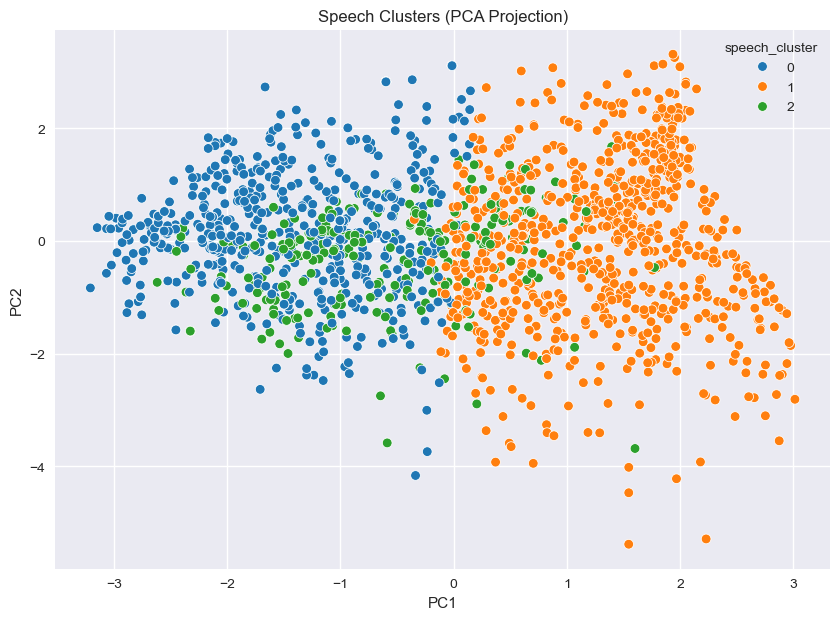

In [113]:
# PCA Visualization

from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pca[:,0],
    y=X_pca[:,1],
    hue=df_clean["speech_cluster"],
    palette="tab10"
)
plt.title("Speech Clusters (PCA Projection)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()



In [114]:
# Cluster Composition by Party

pd.crosstab(df_clean["speech_cluster"], df_clean["party"])



party,Democrat,Independent,Republican
speech_cluster,,,
0,274,22,289
1,316,11,449
2,175,0,116


In [115]:
# Cluster Composition by Type of Speech
pd.crosstab(df_clean["speech_cluster"], df_clean["type_of_speech"])


type_of_speech,bipartisan_and_other_speeches,house_floor_speeches,partisan_rally_speeches,senate_floor_speeches
speech_cluster,,,,
0,252,54,123,183
1,262,76,400,70
2,7,260,25,6


## 3.2. Politician-level Clustering

In [116]:
# Aggregate Emotions and Topics per Politician
df_pol = (
    df_clean.groupby("politician")[features]
            .mean()
            .reset_index()
)

df_pol["party"] = df_pol["politician"].map(party_map)



In [117]:
# Scale Aggregated Features

X_pol = scaler.fit_transform(df_pol[features])


c:\Users\mayas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\mayas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\mayas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\mayas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Window

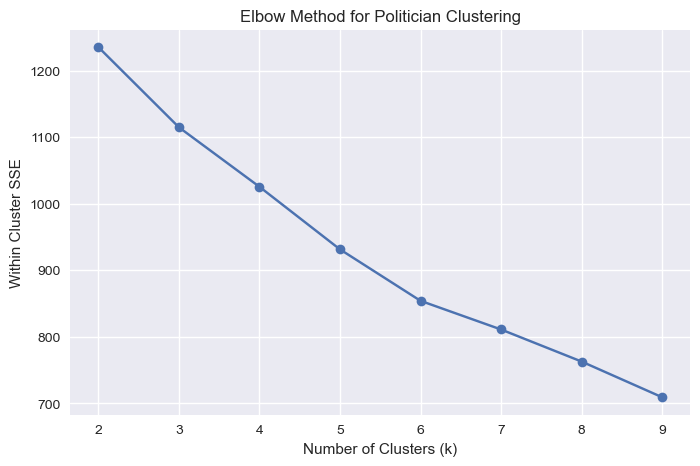

In [118]:
# Determine Optimal Clusters

sse_pol = []
K_range = range(2, 10)

for k in K_range:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(X_pol)
    sse_pol.append(km.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K_range, sse_pol, marker="o")
plt.title("Elbow Method for Politician Clustering")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Within Cluster SSE")
plt.show()



In [119]:
k_pol = 3
km_pol = KMeans(n_clusters=k_pol, random_state=42)
df_pol["politician_cluster"] = km_pol.fit_predict(X_pol)



c:\Users\mayas\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


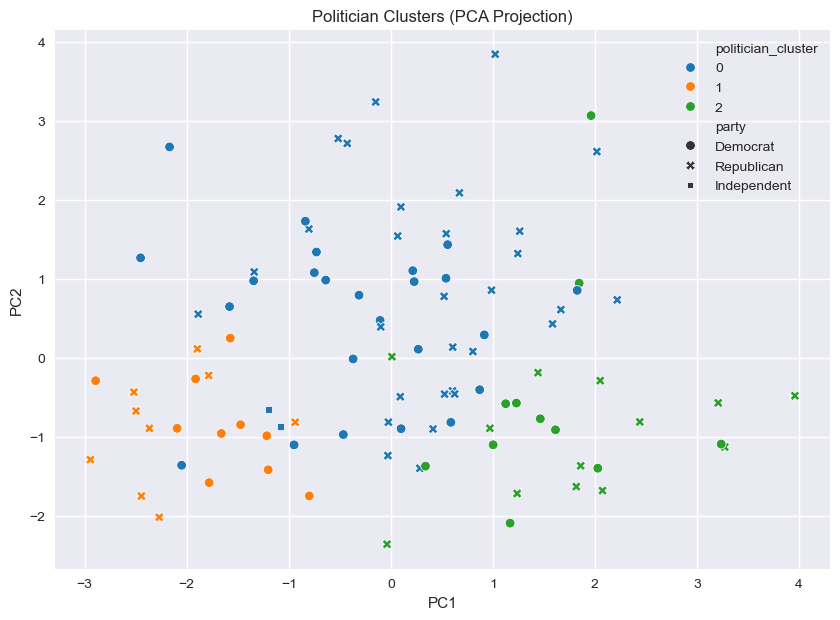

In [120]:
# PCA Visualizations per politician

X_pol_pca = pca.fit_transform(X_pol)

plt.figure(figsize=(10, 7))
sns.scatterplot(
    x=X_pol_pca[:,0],
    y=X_pol_pca[:,1],
    hue=df_pol["politician_cluster"],
    style=df_pol["party"],
    palette="tab10"
)
plt.title("Politician Clusters (PCA Projection)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


In [121]:
# Cluster Compisition per part

pd.crosstab(df_pol["politician_cluster"], df_pol["party"])


party,Democrat,Independent,Republican
politician_cluster,,,
0,24,2,30
1,10,0,9
2,11,0,13


# SECTION 4: Party-Based and Speech-Type-Based Analysis

This section examines how speeches differ across political parties and across types of speech.
The goal is to identify systematic rhetorical patterns, including tonal choices, topic emphasis, and stylistic tendencies that separate Democrats, Republicans, and Independents, as well as partisan versus bipartisan versus procedural speeches.

We focus on three major dimensions:

* Emotional tone

* Topic distributions

* Linguistic characteristics (sentence length and word count)

## 4.1. Emotional Tone by Party

In [98]:
emotion_cols = ["anger", "joy", "sadness", "fear", "love", "surprise"]

party_emotions = df_clean.groupby("party")[emotion_cols].mean()
party_emotions


,anger,joy,sadness,fear,love,surprise
party,,,,,,
Democrat,0.341934,0.458445,0.108749,0.064634,0.020185,0.006052
Independent,0.425321,0.311429,0.178172,0.068827,0.009584,0.006666
Republican,0.307273,0.522073,0.086955,0.056314,0.018676,0.008710


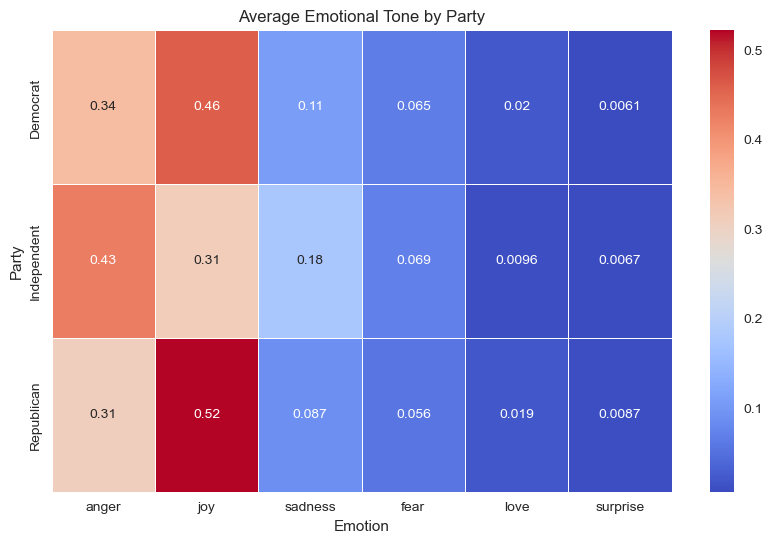

In [99]:
plt.figure(figsize=(10, 6))
sns.heatmap(party_emotions, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Average Emotional Tone by Party")
plt.xlabel("Emotion")
plt.ylabel("Party")
plt.show()


## 4.2. Statistical Tests: Emotional Differences Across Parties

In [122]:
# Kruskal Wallis for each emotion:
    
from scipy.stats import kruskal

emotion_tests = {}
for emo in emotion_cols:
    emotion_tests[emo] = kruskal(
        *[group[emo].values for _, group in df_clean.groupby("party")]
    )

emotion_tests


{'anger': KruskalResult(statistic=np.float64(12.49682419668158), pvalue=np.float64(0.0019335219425964602)),
 'joy': KruskalResult(statistic=np.float64(26.117659363951596), pvalue=np.float64(2.131190781779762e-06)),
 'sadness': KruskalResult(statistic=np.float64(21.575323692042343), pvalue=np.float64(2.0652754739596417e-05)),
 'fear': KruskalResult(statistic=np.float64(4.71306915033184), pvalue=np.float64(0.09474799699230829)),
 'love': KruskalResult(statistic=np.float64(1.1571760923945458), pvalue=np.float64(0.5606894755664654)),
 'surprise': KruskalResult(statistic=np.float64(0.9640416099107469), pvalue=np.float64(0.6175342138592695))}

In [123]:
# Pairwise differences for significant emotions:

import itertools
from scipy.stats import mannwhitneyu

party_list = df_clean["party"].unique()
emotion_pairwise = {}

for emo in emotion_cols:
    emotion_pairwise[emo] = {}
    for p1, p2 in itertools.combinations(party_list, 2):
        g1 = df_clean[df_clean["party"] == p1][emo]
        g2 = df_clean[df_clean["party"] == p2][emo]
        stat, p = mannwhitneyu(g1, g2)
        emotion_pairwise[emo][(p1, p2)] = p

emotion_pairwise


C:\Users\mayas\AppData\Local\Temp\ipykernel_41952\2090072224.py:14: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  stat, p = mannwhitneyu(g1, g2)


{'anger': {('Independent', 'Republican'): np.float64(0.0031894194883561894),
  ('Independent', 'Democrat'): np.float64(0.024454210094725586),
  ('Independent', nan): np.float64(nan),
  ('Republican', 'Democrat'): np.float64(0.01916682075589296),
  ('Republican', nan): np.float64(nan),
  ('Democrat', nan): np.float64(nan)},
 'joy': {('Independent', 'Republican'): np.float64(0.00029713117072693363),
  ('Independent', 'Democrat'): np.float64(0.018531904345207996),
  ('Independent', nan): np.float64(nan),
  ('Republican', 'Democrat'): np.float64(4.285065556241382e-05),
  ('Republican', nan): np.float64(nan),
  ('Democrat', nan): np.float64(nan)},
 'sadness': {('Independent', 'Republican'): np.float64(5.436145517338756e-05),
  ('Independent', 'Democrat'): np.float64(0.0011403527457577618),
  ('Independent', nan): np.float64(nan),
  ('Republican', 'Democrat'): np.float64(0.0050477036006221845),
  ('Republican', nan): np.float64(nan),
  ('Democrat', nan): np.float64(nan)},
 'fear': {('Indepen

## 4.3. Topic Emphasis by Party

In [124]:
topic_cols = [c for c in df_clean.columns if c.startswith("topic_")]

party_topics = df_clean.groupby("party")[topic_cols].mean()
party_topics


,topic_0_score,topic_1_score,topic_2_score,topic_3_score,topic_4_score,topic_5_score,topic_6_score
party,,,,,,,
Democrat,0.035691,0.044659,0.030430,0.030470,0.011507,0.035524,0.023728
Independent,0.059775,0.007294,0.017798,0.007084,0.001503,0.058578,0.060690
Republican,0.040489,0.031405,0.043315,0.029679,0.010469,0.019775,0.029066


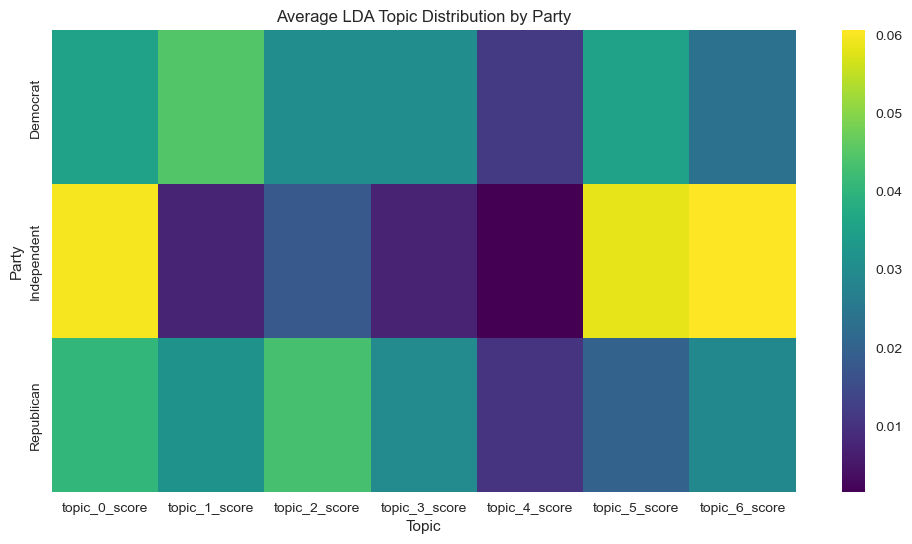

In [103]:
plt.figure(figsize=(12, 6))
sns.heatmap(party_topics, annot=False, cmap="viridis")
plt.title("Average LDA Topic Distribution by Party")
plt.xlabel("Topic")
plt.ylabel("Party")
plt.show()


## 4.4. Linguistic Structure by Party

In [105]:
# Average Word Count
df_clean.groupby("party")["word_count"].mean()


party
Democrat        909.912418
Independent    1216.151515
Republican      997.110070
Name: word_count, dtype: float64

In [106]:
# Average sentence length:
df_clean.groupby("party")["avg_sentence_length"].mean()


party
Democrat       18.938527
Independent    19.026495
Republican     19.109486
Name: avg_sentence_length, dtype: float64

C:\Users\mayas\AppData\Local\Temp\ipykernel_41952\159987337.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_clean, x="party", y="word_count", ax=axes[0], palette="Set2")
C:\Users\mayas\AppData\Local\Temp\ipykernel_41952\159987337.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_clean, x="party", y="avg_sentence_length", ax=axes[1], palette="Set3")


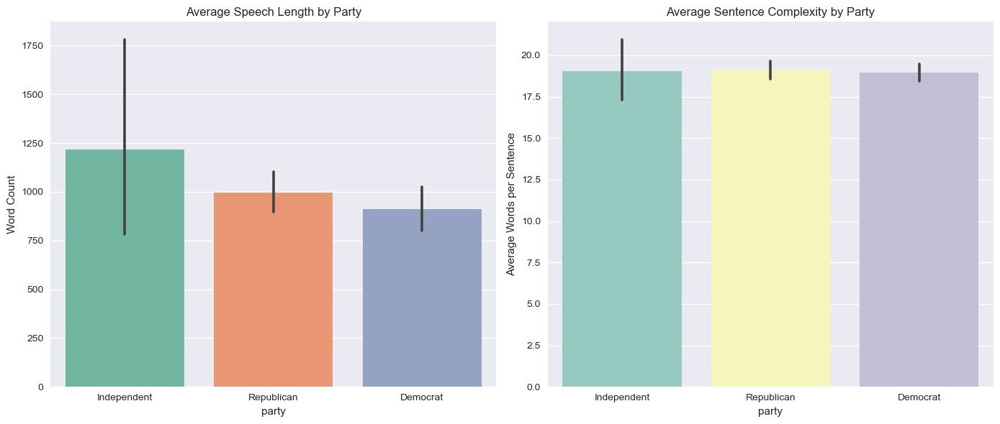

In [107]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.barplot(data=df_clean, x="party", y="word_count", ax=axes[0], palette="Set2")
axes[0].set_title("Average Speech Length by Party")
axes[0].set_ylabel("Word Count")

sns.barplot(data=df_clean, x="party", y="avg_sentence_length", ax=axes[1], palette="Set3")
axes[1].set_title("Average Sentence Complexity by Party")
axes[1].set_ylabel("Average Words per Sentence")

plt.tight_layout()
plt.show()


## 4.5. Comparing Speech Types Across Parties

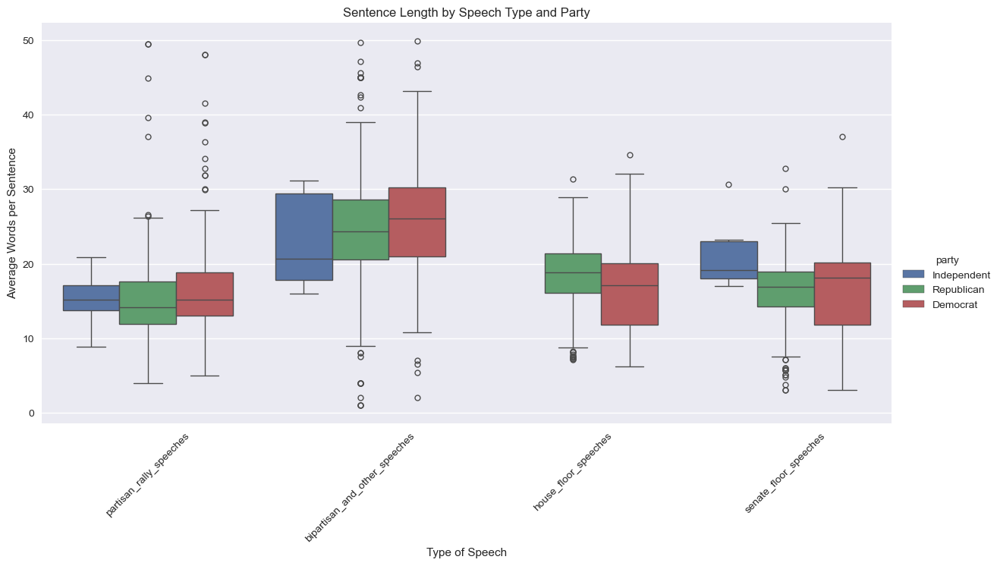

In [108]:
# We analyze how parties differ within each speech type.
sns.catplot(
    data=df_clean, 
    x="type_of_speech", 
    y="avg_sentence_length", 
    hue="party",
    kind="box",
    height=6,
    aspect=2
)
plt.title("Sentence Length by Speech Type and Party")
plt.xlabel("Type of Speech")
plt.ylabel("Average Words per Sentence")
plt.xticks(rotation=45)
plt.show()


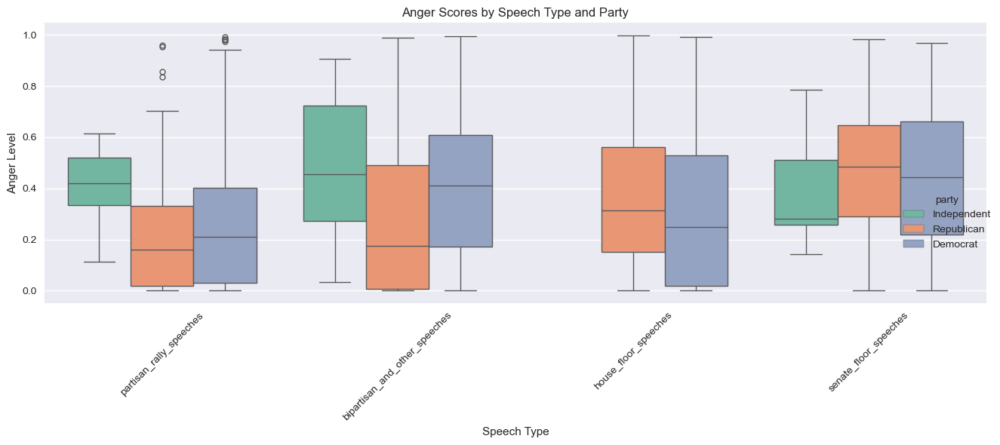

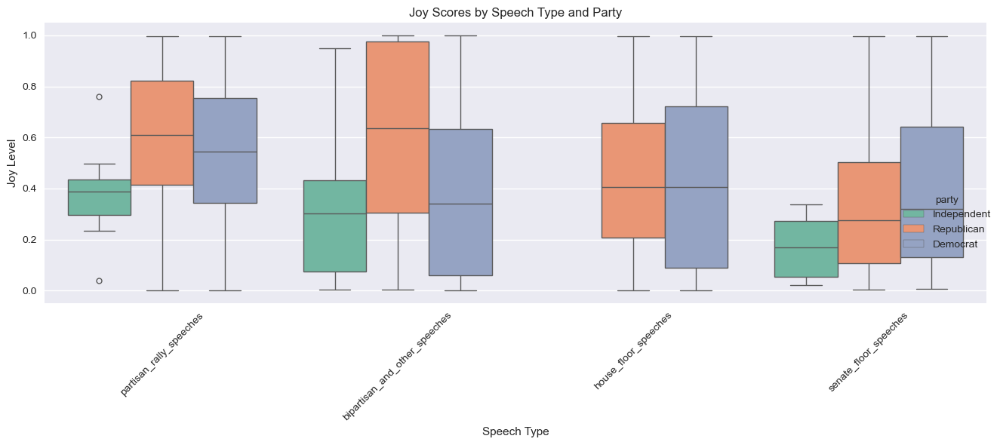

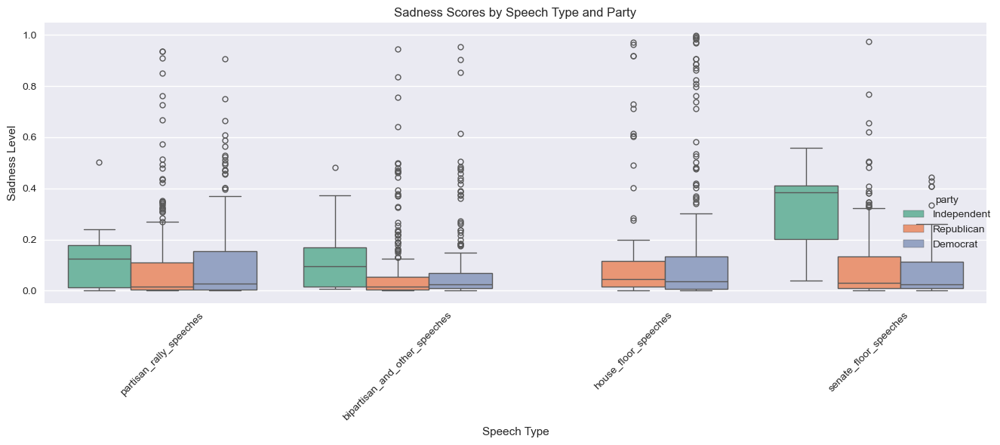

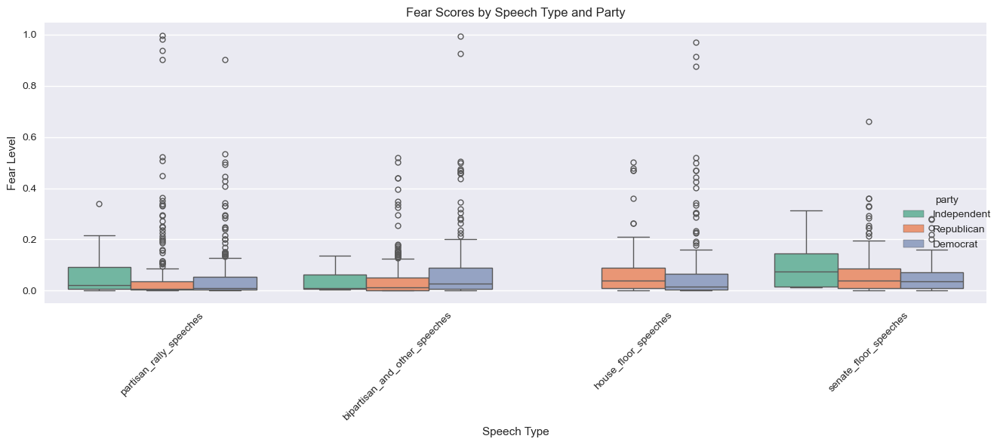

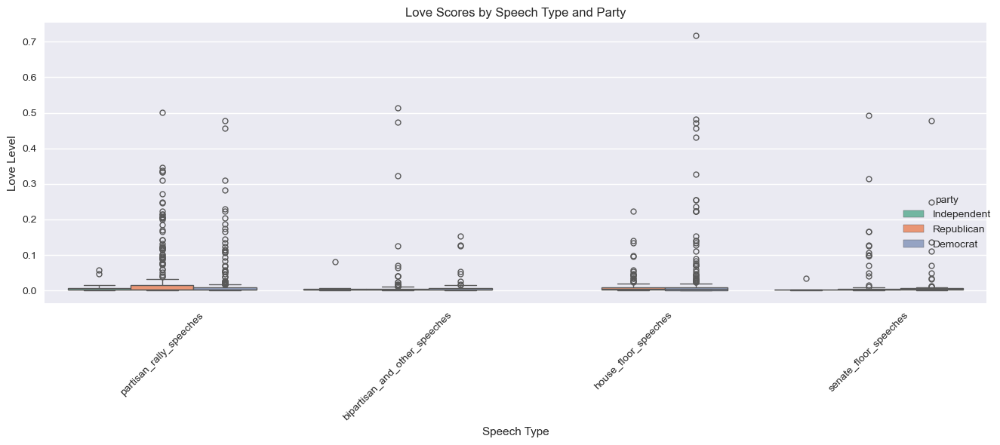

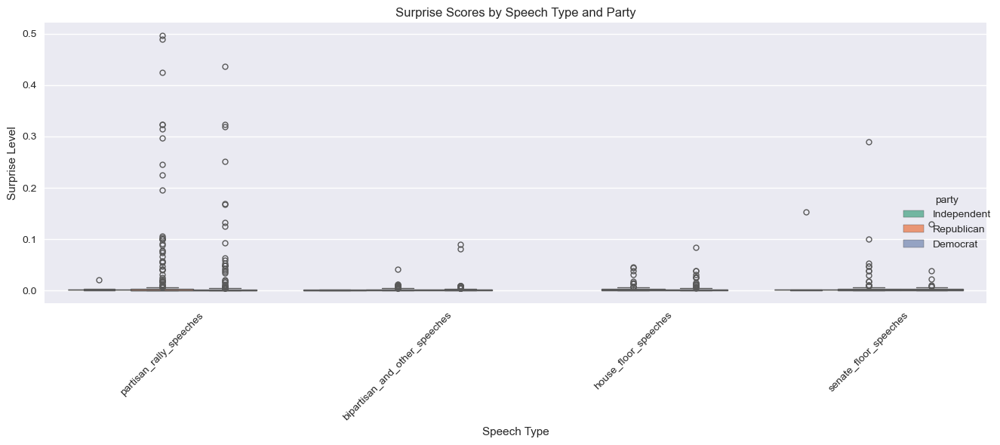

In [110]:
# And for emotional tone
def plot_emotions_by_speech_type(df, emotion_list=emotion_cols):
    """
    Creates boxplots of emotion scores across speech type,
    grouped by party, one plot per emotion.
    """
    for emo in emotion_list:
        g = sns.catplot(
            data=df,
            x="type_of_speech",
            y=emo,
            hue="party",
            kind="box",
            height=6,
            aspect=2,
            palette="Set2"
        )
        plt.title(f"{emo.capitalize()} Scores by Speech Type and Party")
        plt.xlabel("Speech Type")
        plt.ylabel(f"{emo.capitalize()} Level")
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

plot_emotions_by_speech_type(df_clean)


In [111]:
from statsmodels.multivariate.manova import MANOVA

manova_data = df_clean[emotion_cols + ["party"]]
ma = MANOVA.from_formula("anger + joy + sadness + fear + love + surprise ~ party", data=manova_data)
print(ma.mv_test())


                                 Multivariate linear model
                                                                                            
--------------------------------------------------------------------------------------------
       Intercept               Value         Num DF   Den DF          F Value         Pr > F
--------------------------------------------------------------------------------------------
          Wilks' lambda               0.0000 6.0000 1644.0000 176283756842787712.0000 0.0000
         Pillai's trace               1.0000 6.0000 1644.0000 176283756842787744.0000 0.0000
 Hotelling-Lawley trace 643371375338641.2500 6.0000 1644.0000 176283756842787680.0000 0.0000
    Roy's greatest root 643371375338641.2500 6.0000 1644.0000 176283756842787712.0000 0.0000
--------------------------------------------------------------------------------------------
                                                                                            
-----------

# Section 5: Time Series Analysis

This section explores how the emotional content of political speeches changes over time.
By incorporating year, party affiliation, and type of speech, we examine whether rhetorical patterns shift in response to political cycles, elections, crises, and changes in leadership.

Our guiding questions:

1. How do emotional tones evolve from 2016 to 2025?

2. Do parties differ in their emotional trajectories?

3. Do certain types of speeches (rallies, bipartisan remarks, floor speeches) show distinct emotional patterns over time?

In [147]:
import re

def extract_year(filename):
    if not isinstance(filename, str):
        return None
    
    # Extract ANY 4-digit numbers
    match = re.findall(r"(\d{4})", filename)
    
    # No match
    if not match:
        return None
    
    # Convert all matches to integers, keep only years after 2000
    years = [int(y) for y in match if 2000 <= int(y) <= 2099]
    
    return years[0] if years else None
df_clean["year"] = df_clean["file_name"].apply(extract_year)


In [148]:
df_time = df_clean.dropna(subset=["year"]).copy()
df_time["year"] = df_time["year"].astype(int)


In [149]:
df_time["year"].value_counts().sort_index()


year
2010      1
2012      7
2013      2
2014      4
2015      1
2016    285
2017     49
2018     25
2019     24
2020     49
2021     42
2022     23
2023     43
2024    226
2025    253
Name: count, dtype: int64

In [153]:
# Average Emotion Per Year

df_time = df_time[df_time["year"] >= 2016].copy()

emotion_cols = ["anger", "joy", "sadness", "fear", "love", "surprise"]

yearly_emotions = (
    df_time.groupby("year")[emotion_cols]
           .mean()
           .reset_index()
)
yearly_emotions


,year,anger,joy,sadness,fear,love,surprise
0,2016,0.297451,0.499345,0.105761,0.065332,0.024339,0.007773
1,2017,0.373288,0.382121,0.151948,0.065269,0.016235,0.011139
2,2018,0.276787,0.576179,0.082539,0.034472,0.024879,0.005144
3,2019,0.373336,0.436836,0.060654,0.074571,0.044014,0.010589
4,2020,0.332017,0.459324,0.121883,0.068994,0.013013,0.004770
5,2021,0.508701,0.286093,0.126692,0.055655,0.016480,0.006380
6,2022,0.268879,0.515713,0.156240,0.030603,0.020551,0.008014
7,2023,0.503196,0.370313,0.043754,0.067854,0.007676,0.007207
8,2024,0.363727,0.419195,0.123809,0.065507,0.022478,0.005284
9,2025,0.361939,0.468129,0.095567,0.064103,0.006861,0.003401


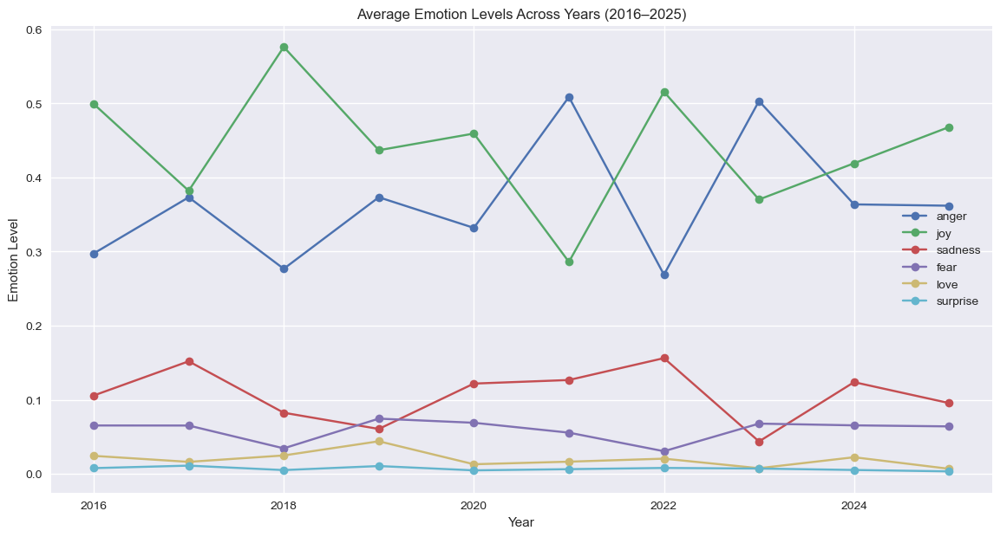

In [154]:
plt.figure(figsize=(14, 7))
for emo in emotion_cols:
    plt.plot(yearly_emotions["year"], yearly_emotions[emo], marker="o", label=emo)

plt.title("Average Emotion Levels Across Years (2016–2025)")
plt.xlabel("Year")
plt.ylabel("Emotion Level")
plt.legend()
plt.grid(True)
plt.show()


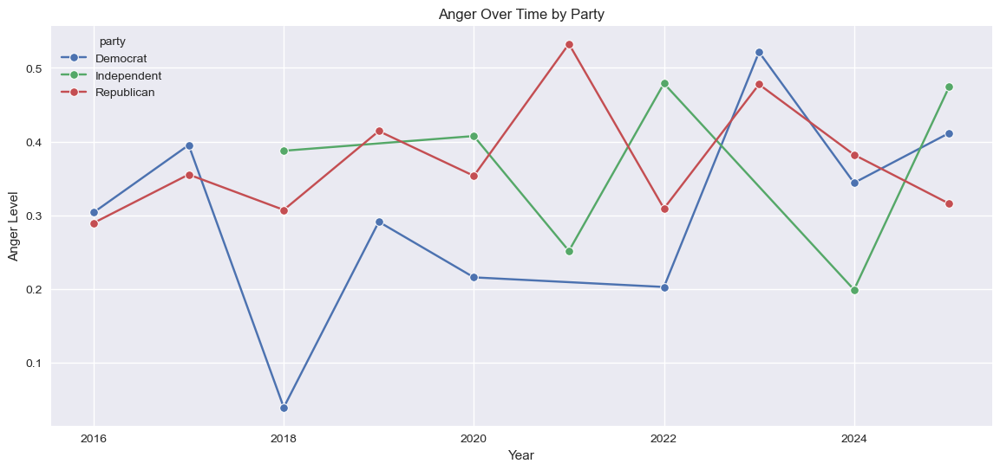

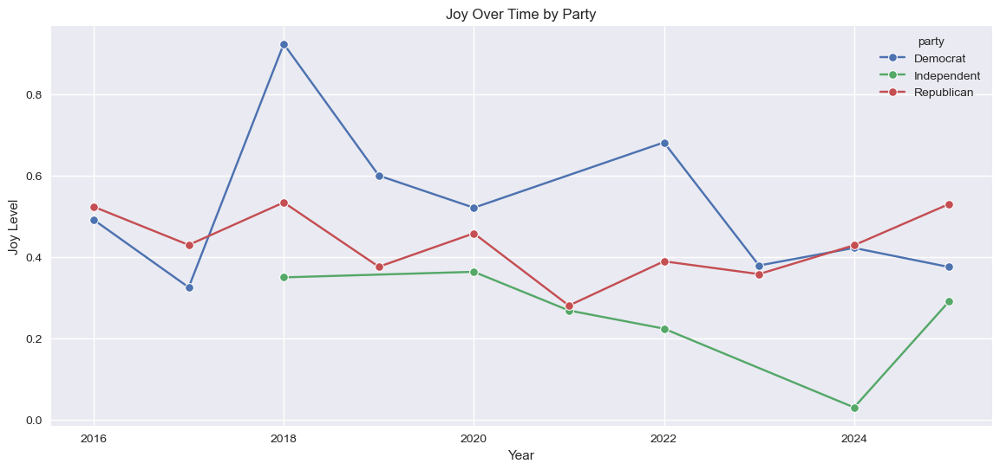

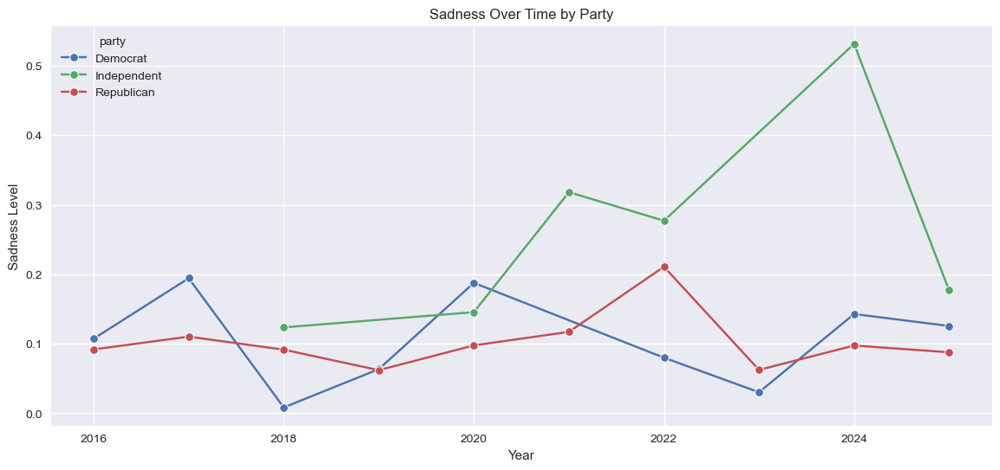

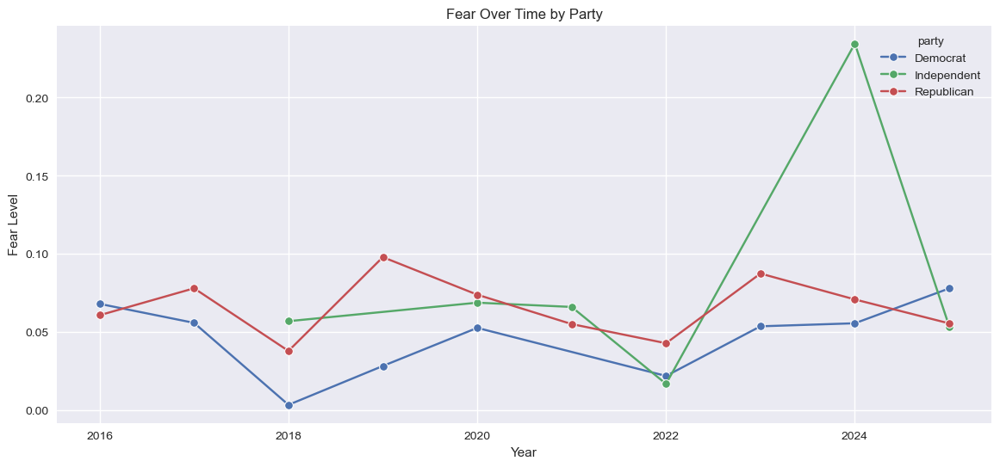

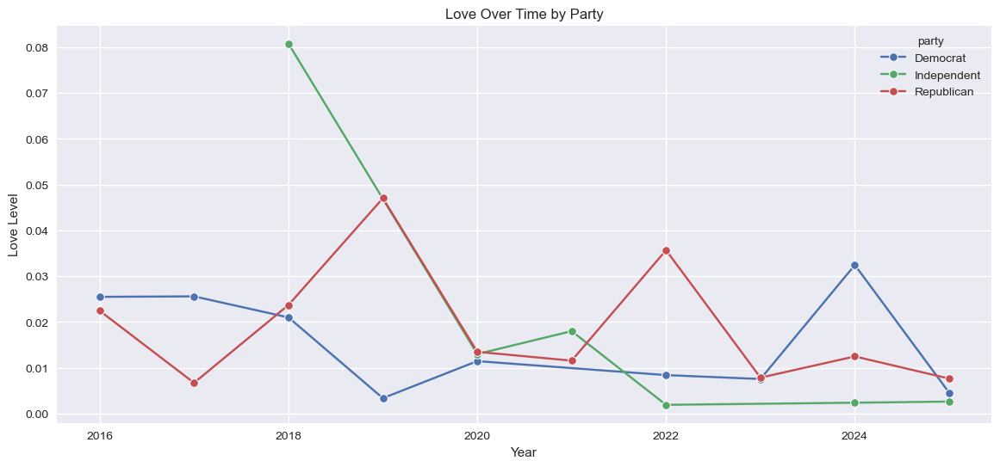

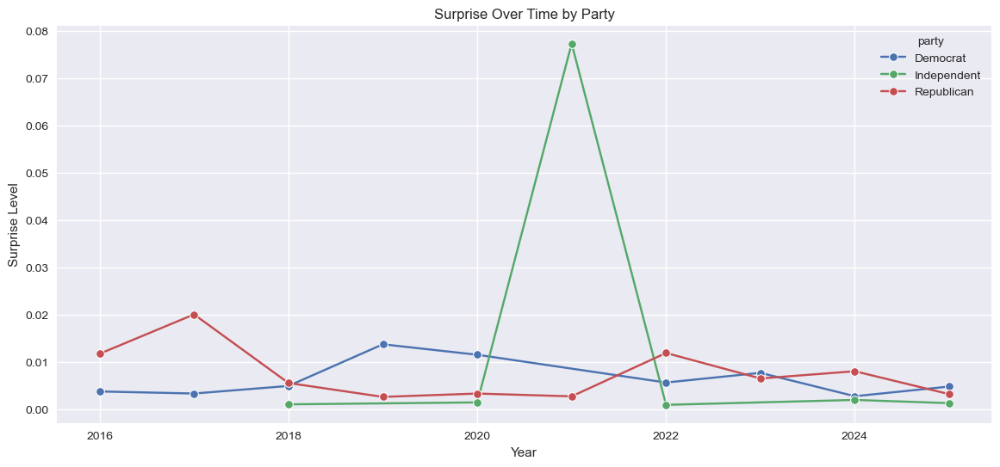

In [157]:
#Compute per-party per-year means and plot them
party_year_emotions = (
    df_time.groupby(["party", "year"])[emotion_cols]
           .mean()
           .reset_index()
)


def plot_emotion_over_time_by_party(df, emotion):
    plt.figure(figsize=(14, 6))
    sns.lineplot(
        data=df,
        x="year",
        y=emotion,
        hue="party",
        marker="o"
    )
    plt.title(f"{emotion.capitalize()} Over Time by Party")
    plt.xlabel("Year")
    plt.ylabel(f"{emotion.capitalize()} Level")
    plt.grid(True)
    plt.show()


for emo in emotion_cols:
    plot_emotion_over_time_by_party(party_year_emotions, emo)


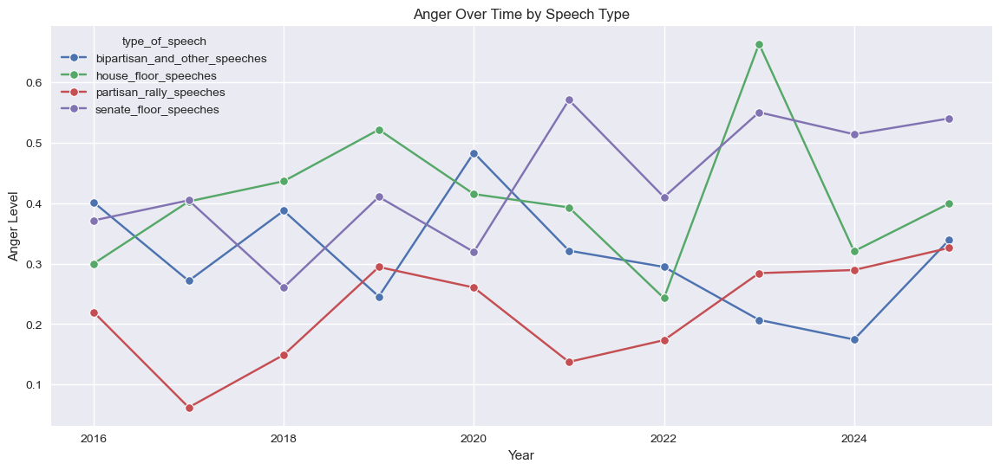

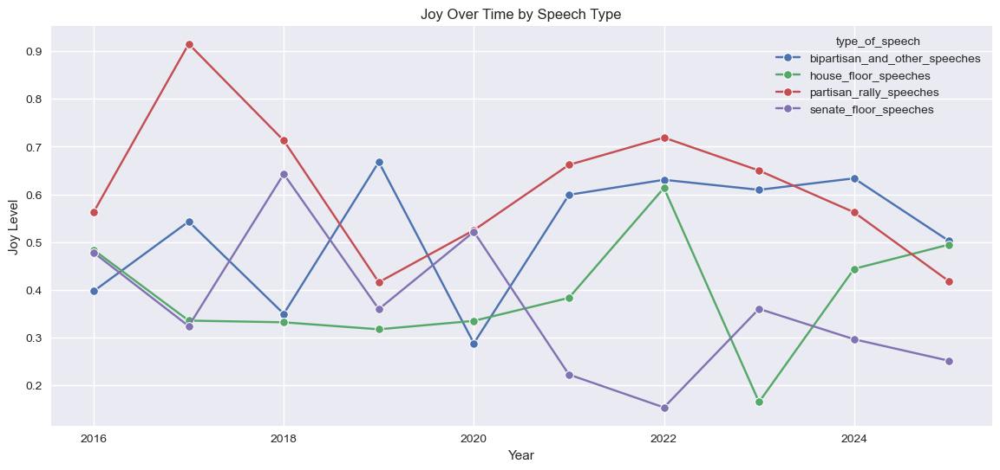

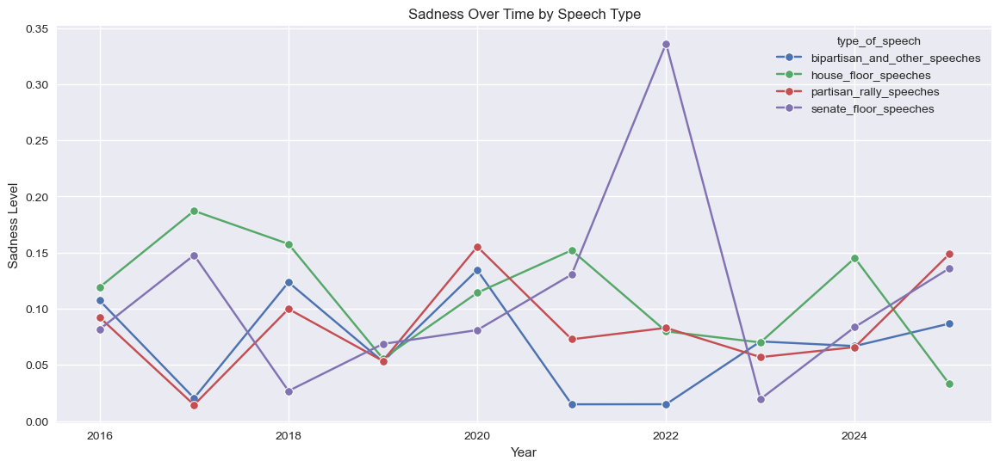

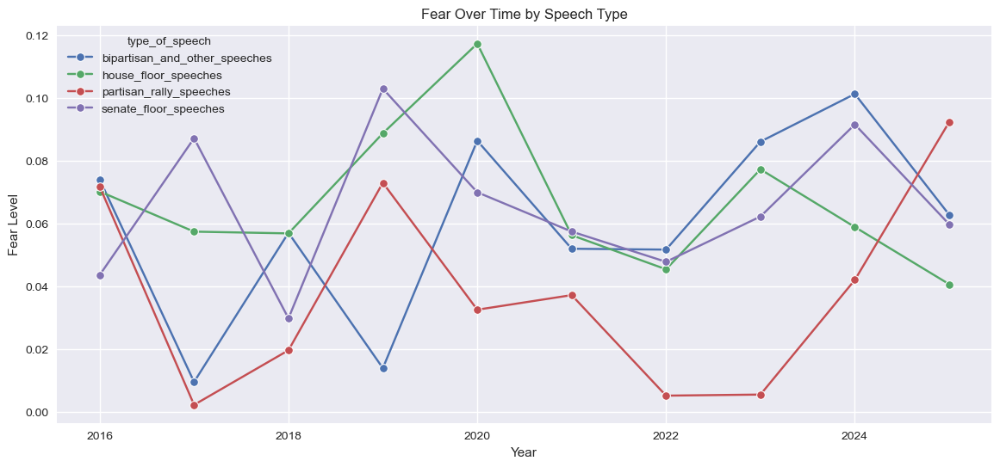

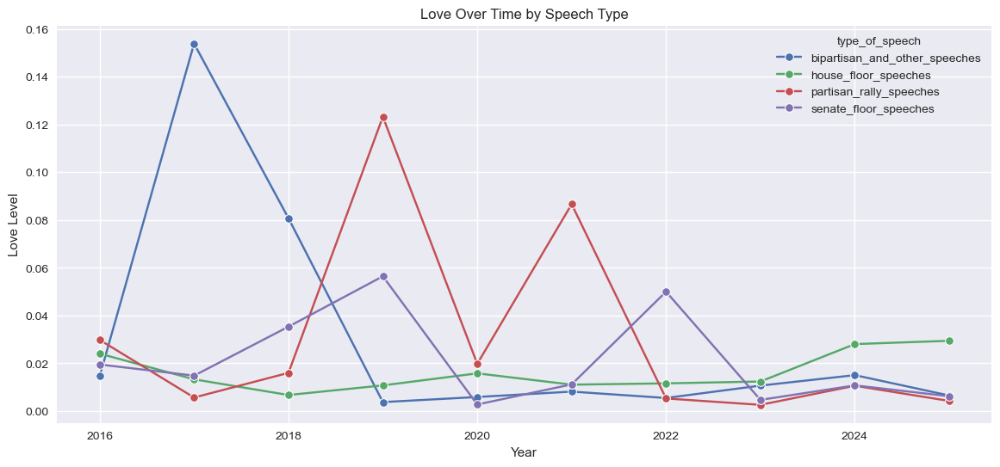

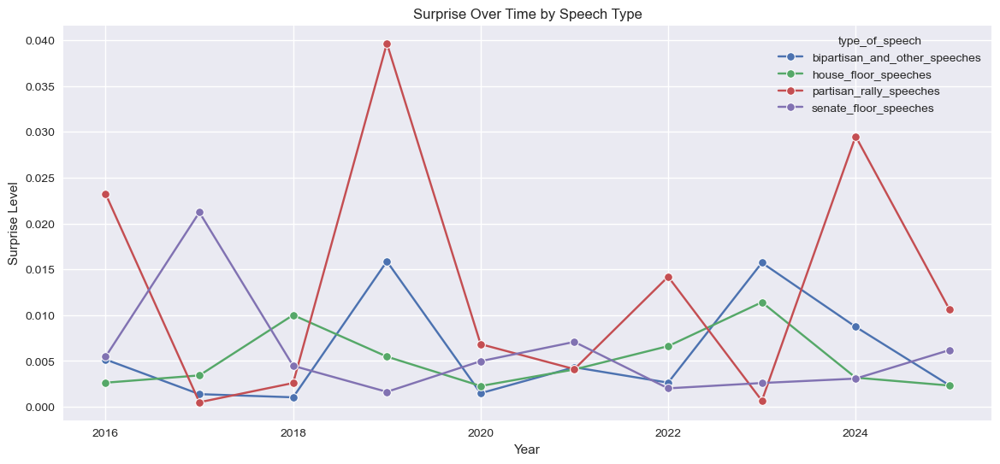

In [158]:
# Emotional Trends by Speech Type Across Years
type_year_emotions = (
    df_time.groupby(["type_of_speech", "year"])[emotion_cols]
           .mean()
           .reset_index()
)


def plot_emotion_over_time_by_type(df, emotion):
    plt.figure(figsize=(14, 6))
    sns.lineplot(
        data=df,
        x="year",
        y=emotion,
        hue="type_of_speech",
        marker="o"
    )
    plt.title(f"{emotion.capitalize()} Over Time by Speech Type")
    plt.xlabel("Year")
    plt.ylabel(f"{emotion.capitalize()} Level")
    plt.grid(True)
    plt.show()


for emo in emotion_cols:
    plot_emotion_over_time_by_type(type_year_emotions, emo)


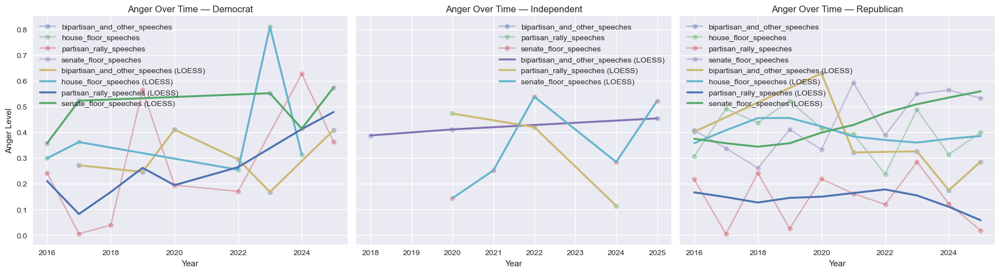

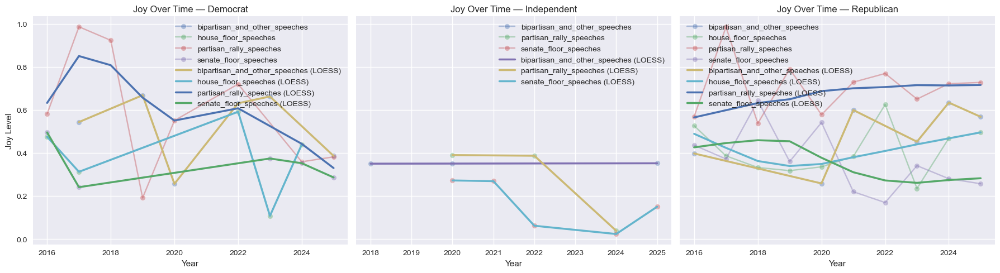

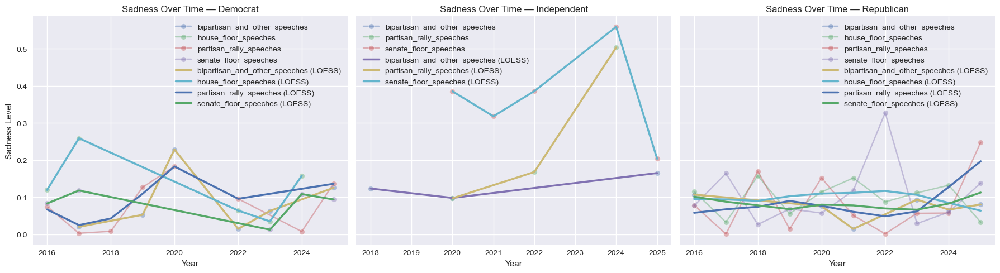

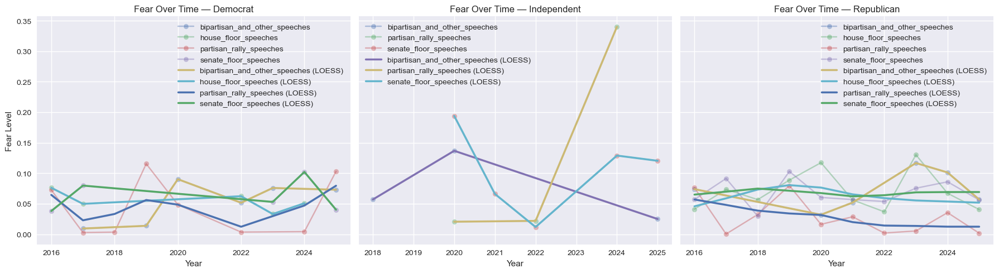

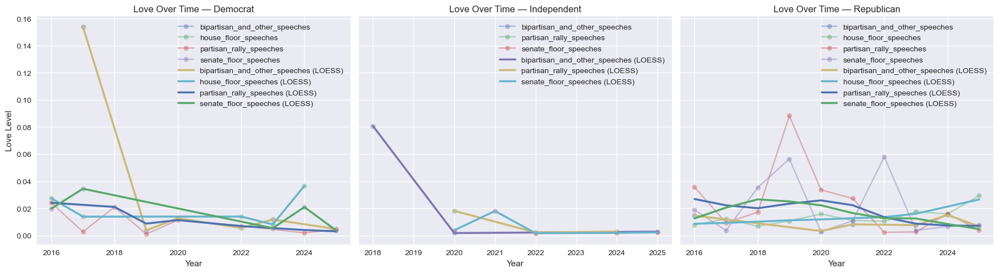

...

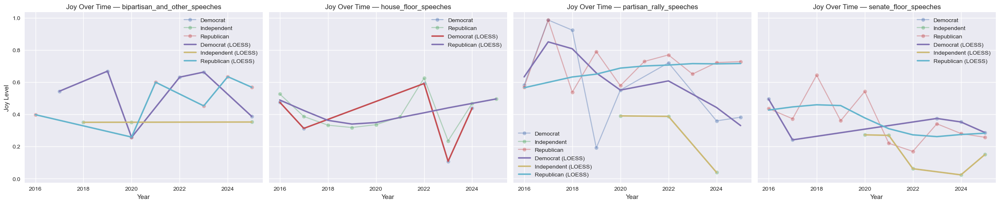

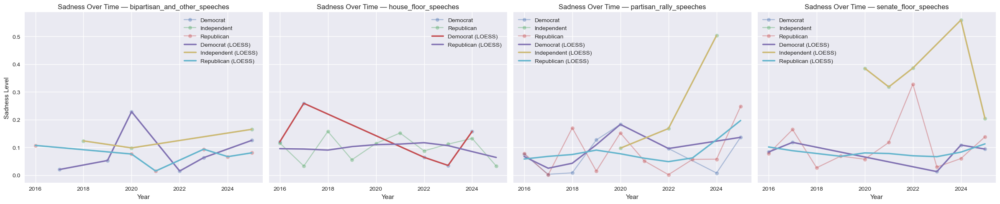

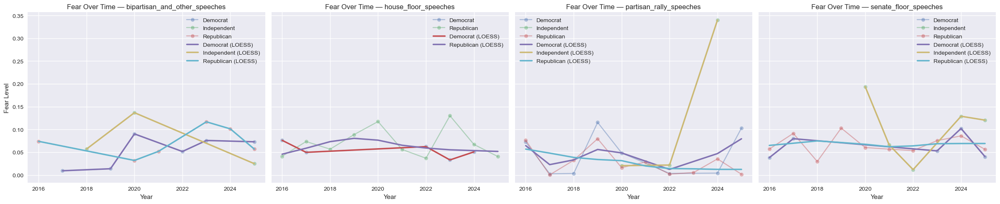

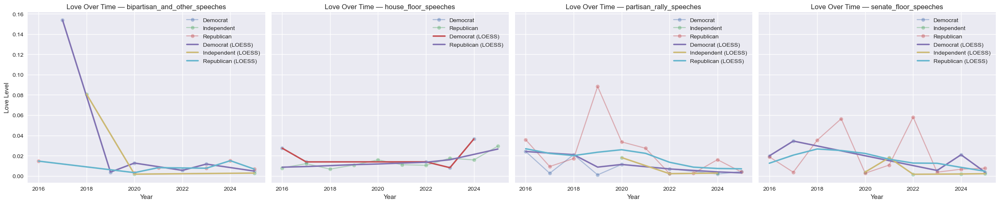

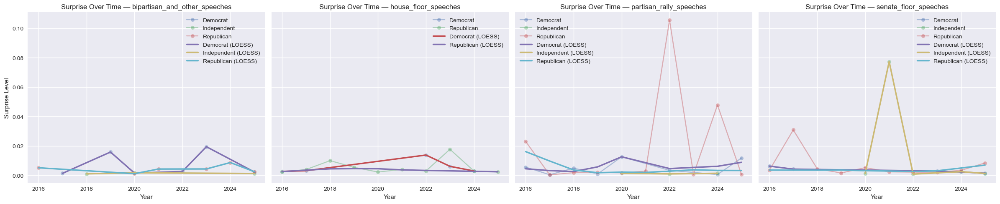

In [166]:
# Joint Effects: Party × Speech Type × Year

from statsmodels.nonparametric.smoothers_lowess import lowess



emotion_cols = ["anger", "joy", "sadness", "fear", "love", "surprise"]

# Prepare dataset (already created earlier)
party_type_year = (
    df_time.groupby(["party", "type_of_speech", "year"])[emotion_cols]
           .mean()
           .reset_index()
)



def plot_emotions_by_year_per_party(df, emotion, parties=None, frac=0.6):
    """
    Plots emotion over time with side-by-side subplots for each party.
    Includes LOESS smoothing.
    
    frac controls smoothing (0.3 = wigglier, 0.8 = smoother).
    """

    if parties is None:
        parties = df["party"].unique()
    
    n = len(parties)
    fig, axes = plt.subplots(1, n, figsize=(6*n, 5), sharey=True)

    if n == 1:
        axes = [axes]  # handle single panel gracefully

    for ax, party in zip(axes, parties):
        subset = df[df["party"] == party]

        # Raw line (optional but helpful)
        sns.lineplot(
            data=subset,
            x="year",
            y=emotion,
            hue="type_of_speech",
            marker="o",
            alpha=0.4,
            ax=ax
        )

        # LOESS smoothed lines per speech type
        for stype in subset["type_of_speech"].unique():
            df_temp = subset[subset["type_of_speech"] == stype].copy()
            
            if len(df_temp) > 1:
                smoothed = lowess(
                    df_temp[emotion],
                    df_temp["year"],
                    frac=frac,
                    return_sorted=True
                )
                ax.plot(
                    smoothed[:, 0],
                    smoothed[:, 1],
                    linewidth=2.5,
                    label=f"{stype} (LOESS)"
                )
        
        ax.set_title(f"{emotion.capitalize()} Over Time — {party}")
        ax.set_xlabel("Year")
        ax.set_ylabel(f"{emotion.capitalize()} Level")
        ax.grid(True)
        ax.legend()
    
    plt.tight_layout()
    plt.show()

def plot_emotions_by_year_per_type(df, emotion, types=None, frac=0.6):
    """
    Plots emotion over time with side-by-side subplots for each speech type.
    Includes LOESS smoothing.
    """

    if types is None:
        types = df["type_of_speech"].unique()
    
    n = len(types)
    fig, axes = plt.subplots(1, n, figsize=(6*n, 5), sharey=True)

    if n == 1:
        axes = [axes] 

    for ax, stype in zip(axes, types):
        subset = df[df["type_of_speech"] == stype]

        sns.lineplot(
            data=subset,
            x="year",
            y=emotion,
            hue="party",
            marker="o",
            alpha=0.4,
            ax=ax
        )

        # LOESS smoothing per party
        for party in subset["party"].unique():
            df_temp = subset[subset["party"] == party].copy()
            
            if len(df_temp) > 1:
                smoothed = lowess(
                    df_temp[emotion],
                    df_temp["year"],
                    frac=frac,
                    return_sorted=True
                )
                ax.plot(
                    smoothed[:, 0],
                    smoothed[:, 1],
                    linewidth=2.5,
                    label=f"{party} (LOESS)"
                )

        ax.set_title(f"{emotion.capitalize()} Over Time — {stype}")
        ax.set_xlabel("Year")
        ax.set_ylabel(f"{emotion.capitalize()} Level")
        ax.grid(True)
        ax.legend()
    
    plt.tight_layout()
    plt.show()


for emo in emotion_cols:
    plot_emotions_by_year_per_party(party_type_year, emo)

for emo in emotion_cols:
    plot_emotions_by_year_per_type(party_type_year, emo)

